![](https://www.dii.uchile.cl/wp-content/uploads/2021/06/Magi%CC%81ster-en-Ciencia-de-Datos.png)


# Proyecto: Riesgo en el Banco Giturra

**MDS7202: Laboratorio de Programación Científica para Ciencia de Datos**

### Cuerpo Docente:

- Profesor: Pablo Badilla, Ignacio Meza De La Jara
- Auxiliar: Sebastián Tinoco
- Ayudante: Diego Cortez M., Felipe Arias T.

_Por favor, lean detalladamente las instrucciones de la tarea antes de empezar a escribir._

---

## Reglas

- Fecha de entrega: 01/06/2021
- **Grupos de 2 personas.**
- Cualquier duda fuera del horario de clases al foro. Mensajes al equipo docente serán respondidos por este medio.
- Estrictamente prohibida la copia.
- Pueden usar cualquier material del curso que estimen conveniente.


# Cosas que faltan

1.0 Terminar introducción

8.0 Hacer conclusión

---


# Presentación del Problema


![](https://www.diarioeldia.cl/u/fotografias/fotosnoticias/2019/11/8/67218.jpg)


**Giturra**, un banquero astuto y ambicioso, estableció su propio banco con el objetivo de obtener enormes ganancias. Sin embargo, su reputación se vio empañada debido a las tasas de interés usureras que imponía a sus clientes. A medida que su banco crecía, Giturra enfrentaba una creciente cantidad de préstamos impagados, lo que amenazaba su negocio y su prestigio.

Para abordar este desafío, Giturra reconoció la necesidad de reducir los riesgos de préstamo y mejorar la calidad de los préstamos otorgados. Decidió aprovechar la ciencia de datos y el análisis de riesgo crediticio. Contrató a un equipo de expertos para desarrollar un modelo predictivo de riesgo crediticio.

Cabe señalar que lo modelos solicitados por el banquero deben ser interpretables. Ya que estos le permitirá al equipo comprender y explicar cómo se toman las decisiones crediticias. Utilizando visualizaciones claras y explicaciones detalladas, pudieron identificar las características más relevantes, le permitirá analizar la distribución de la importancia de las variables y evaluar si los modelos son coherentes con el negocio.

Para esto Giturra les solicita crear un modelo de riesgo disponibilizandoles una amplia gama de variables de sus usuarios: como historiales de crédito, ingresos y otros factores financieros relevantes, para evaluar la probabilidad de incumplimiento de pago de los clientes. Con esta información, Giturra podrá tomar decisiones más informadas en cuanto a los préstamos, ofreciendo condiciones más favorables a aquellos con menor riesgo de impago.


## Instalación de Librerías.


Para el desarrollo de su proyecto, utilice el conjunto de datos `dataset.pq` para entrenar un modelo de su elección. Además, se adjunta junto con los datos del proyecto un archivo llamado `requirements.txt` que contiene todas las bibliotecas y versiones necesarias para el desarrollo del proyecto. Se le recomienda levantar un ambiente de `conda` para instalar estas librerías y así evitar cualquier problema con las versiones.


In [ ]:
#!pip install joblib==1.3.1
#!pip install numpy==1.25.1
#!pip install pandas==2.0.3
#!pip install python-dateutil==2.8.2
#!pip install pytz==2023.3
#!pip install scikit-learn==1.3.0
#!pip install scipy==1.11.1
#!pip install six==1.16.0
#!pip install threadpoolctl==3.2.0
#!pip install tzdata==2023.3

!pip install xgboost
!pip install lightgbm

In [ ]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 11.6 MB/s eta 0:00:00


In [ ]:
pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.6/390.6 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 21.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 9.1 MB/s eta 0:00:00


# Proyecto

### Equipo:

- Catherine Benavides
- Fernanda Saavedra


### Link de repositorio de GitHub: https://github.com/FernandaSD/MDS7202

## 1. Introducción [0.5 puntos]

En el siguiente proyecto se presenta un problema de riesgo de crédito en el cual se busca predecir la variable `credit_score` a través de modelos de clasificación, de forma de poder minimzar los riesgos de los préstamos y poder mejorar la calidad de los mismos.

Los datos utilizados durante el proyecto consisten en características de los clientes del banco y de su historial crediticio. Entre ellas encontramos, por una parte, su edad y ocupación, y por otra parte, variables como cantidad de pagos retrasados, montos mensuales de inversión, entre otros.

Para evaluar los modelos de clasificación se seleccionó la métrica `F1-score` dado que esta métrica considera el desbalance de clases. Esto es importante en modelos de clasificación que tienden a favorar la clase mayoritaria. El `F1-score` combina la precisión y el recall para tener en cuenta tanto los verdaderos positivos como los falsos negativos pudiendo medir la efectividad global del modelo en ambas áreas, lo que lo convierte en una métrica adecuada para evaluar el rendimiento del modelo en un contexto de clases desequilibradas. Por otro lado, en el riesgo crediticio, es  importante identificar correctamente a los clientes que tienen un alto riesgo de no pago y el `F1-score` prioriza la minimización de los falsos negativos. Adicionalmente, se comenta que se escogió la clase 1 para evaluar la métrica ya que esta contiene a los clientes riesgosos y es la clase minoritaria.

Por otra parte, para resolver el problema se utilizó el modelo `RandomForestClassifier`, el cual fue el que obtuvo mejores resultados. Adicionalmente, antes de utilizar los datos para clasificar, fueron pasados por un `ColumnTransformer` donde a las variables categóricas se les aplico `OneHotEncoder`, a las numéricas `MinMaxScaler`, y se imputaron datos faltantes por la media de los datos.

A través del modelo se logra identificar cuales son las variables más relevantes para determinar el `credit_score` de una persona. Se considera que el modelo tuvo un desempeño aceptable, considerando que el `F1 score` del baseline es de 0.35 y el del mejor modelo de 0.63 con los hiperparámentros ajustados. Con respecto al desempeño de otros equipos no se cree estar entre los mejores, dado que no se hizo una búsqueda de hiperparámetros muy extensa dado los grandes tiempos de ejecución necesarios para ello. Además cabe destacar que la comparación sólo sería comparable si se testearan dichos modelos en los mismos datasets, ya que las instacias disponibles en testeo pueden variar dráticamente los resultados.


## 2. Preliminares [Sin puntaje]

Antes de comenzar con el proyecto se necesita conectar el colab con Google Drive para poder acceder y cargar la base de datos.

In [ ]:
# Conexión con drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Adicionalmente, se importan todas las librerías que se utilizarán a lo largo de este trabajo.

In [ ]:
# Librerías
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
import joblib
import optuna

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, MinMaxScaler
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.feature_selection import SelectPercentile, f_classif
from sklearn.pipeline import Pipeline
from imblearn.combine import SMOTEENN

from sklearn.model_selection import train_test_split
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

from sklearn.model_selection import GridSearchCV
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import make_scorer, f1_score
import shap

## 3. Carga y Análisis Exploratorio de Datos [Sin puntaje]

En esta sección se cargarán y analizarán los datos para investigar patrones, tendencias y relaciones. Para este proyecto se trabajará con el conjunto de datos `dataset.pq` (ver [enlace](https://www.kaggle.com/datasets/parisrohan/credit-score-classification) para mayor detalle).

### 3.1 Carga de Datos

Como primer paso se carga y visualiza el conjunto de datos a utilizar.

In [ ]:
# Se carga el dataset
df_original = pd.read_parquet("/content/drive/MyDrive/dataset.pq")

In [ ]:
# se visualiza la base
df_original.head()

,customer_id,age,occupation,annual_income,monthly_inhand_salary,num_bank_accounts,num_credit_card,interest_rate,num_of_loan,delay_from_due_date,...,num_credit_inquiries,outstanding_debt,credit_utilization_ratio,credit_history_age,payment_of_min_amount,total_emi_per_month,amount_invested_monthly,payment_behaviour,monthly_balance,credit_score
0,CUS_0xd40,23.0,Scientist,19114.12,1824.843333,3,4,3,4.0,3,...,4.0,809.98,23.933795,NaN,No,49.574949,24.785217,High_spent_Medium_value_payments,358.124168,0
1,CUS_0x21b1,28.0,Teacher,34847.84,3037.986667,2,4,6,1.0,3,...,2.0,605.03,32.933856,27.0,No,18.816215,218.904344,Low_spent_Small_value_payments,356.078109,0
2,CUS_0x2dbc,34.0,Engineer,143162.64,12187.220000,1,5,8,3.0,8,...,3.0,1303.01,38.374753,18.0,No,246.992319,10000.000000,High_spent_Small_value_payments,895.494583,0
3,CUS_0xb891,55.0,Entrepreneur,30689.89,2612.490833,2,5,4,-100.0,4,...,4.0,632.46,27.332515,17.0,No,16.415452,125.617251,High_spent_Small_value_payments,379.216381,0
4,CUS_0x1cdb,21.0,Developer,35547.71,2853.309167,7,5,5,-100.0,1,...,4.0,943.86,25.862922,31.0,Yes,0.000000,181.330901,High_spent_Small_value_payments,364.000016,0


### 3.2 Análisis Exploratorio

A continuación, se hace un análisis de los datos (revisando el archivo `profile` adjunto), buscando patrones, tendencias, relaciones o infactibilidad en los datos.

In [ ]:
# Balance de clases
print(df_original[df_original['credit_score'] == 1].shape)
print(df_original[df_original['credit_score'] == 0].shape)

(3602, 22)
(8898, 22)


In [ ]:
# Información variables
df_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12500 entries, 0 to 12499
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_id               12500 non-null  object 
 1   age                       12500 non-null  float64
 2   occupation                12500 non-null  object 
 3   annual_income             12500 non-null  float64
 4   monthly_inhand_salary     10584 non-null  float64
 5   num_bank_accounts         12500 non-null  int64  
 6   num_credit_card           12500 non-null  int64  
 7   interest_rate             12500 non-null  int64  
 8   num_of_loan               12500 non-null  float64
 9   delay_from_due_date       12500 non-null  int64  
 10  num_of_delayed_payment    11660 non-null  float64
 11  changed_credit_limit      12246 non-null  float64
 12  num_credit_inquiries      12243 non-null  float64
 13  outstanding_debt          12500 non-null  float64
 14  credit

In [ ]:
# Descripción variables numéricas
df_original.describe()

,age,annual_income,monthly_inhand_salary,num_bank_accounts,num_credit_card,interest_rate,num_of_loan,delay_from_due_date,num_of_delayed_payment,changed_credit_limit,num_credit_inquiries,outstanding_debt,credit_utilization_ratio,credit_history_age,total_emi_per_month,amount_invested_monthly,monthly_balance,credit_score
count,12500.000000,1.250000e+04,10584.000000,12500.000000,12500.000000,12500.000000,12500.000000,12500.000000,11660.00000,12246.000000,12243.000000,12500.000000,12500.000000,11380.000000,12500.000000,11914.000000,1.214500e+04,12500.000000
mean,105.771840,1.616206e+05,4186.634963,16.939920,23.172720,73.213360,3.099440,21.060880,32.93542,10.398582,26.292330,1426.220376,32.349265,18.230404,1488.394291,638.798715,-2.744614e+22,0.288160
std,664.502705,1.297842e+06,3173.690362,114.350815,132.005866,468.682227,65.105277,14.863091,237.43768,6.799253,181.821031,1155.169458,5.156815,8.302078,8561.449910,2049.195193,3.024684e+24,0.452924
min,-500.000000,7.005930e+03,303.645417,-1.000000,0.000000,1.000000,-100.000000,-5.000000,-3.00000,-6.490000,0.000000,0.230000,20.100770,0.000000,0.000000,0.000000,-3.333333e+26,0.000000
25%,25.000000,1.945333e+04,1622.408646,3.000000,4.000000,8.000000,1.000000,10.000000,9.00000,5.370000,4.000000,566.072500,28.066517,12.000000,31.496968,73.736810,2.701501e+02,0.000000
50%,33.000000,3.757238e+04,3087.595000,6.000000,5.000000,14.000000,3.000000,18.000000,14.00000,9.410000,6.000000,1166.155000,32.418953,18.000000,72.887628,134.093193,3.393885e+02,0.000000
75%,42.000000,7.269021e+04,5967.937500,7.000000,7.000000,20.000000,5.000000,28.000000,18.00000,14.940000,10.000000,1945.962500,36.623650,25.000000,169.634826,261.664256,4.714245e+02,1.000000
max,8678.000000,2.383470e+07,15204.633333,1756.000000,1499.000000,5789.000000,1495.000000,67.000000,4293.00000,36.970000,2554.000000,4998.070000,48.199824,33.000000,81971.000000,10000.000000,1.463792e+03,1.000000


Se puede observar que hay datos con valores infactibles, esto es, valores negativos o valores muy altos como el caso de la variable `age`. Para estos casos, se decide eliminar el registro del dataframe. Además, hay variables con outiliers que también son quitados, definiendo (dado el histograma de la variable) un umbral para eliminar.

In [ ]:
# Se copia el dataframe
df = df_original.copy()

# age
df = df[(df['age'] > 0) & (df['age'] < 120)]

# annual_income
df = df[df['annual_income'] < 300000]

# num_bank_accounts
df = df[(df['num_bank_accounts'] > 0) & (df['num_bank_accounts'] < 20)]

# num_credit_card
df = df[df['num_credit_card'] < 20]

# interest_rate
df = df[df['interest_rate'] < 50]

# num_of_loan
df = df[(df['num_of_loan'] > 0) & (df['num_of_loan'] < 50)]

# delay_from_due_date
df = df[df['delay_from_due_date'] > 0]

# num_of_delayed_payment
df = df[(df['num_of_delayed_payment'] > 0) & (df['num_of_delayed_payment'] < 100)]

# num_credit_inquuiries outlier
df = df[df['num_credit_inquiries'] < 20]

# total_emi_per_month
df = df[df['total_emi_per_month'] < 1400]

# monthly_balance
df = df[df['monthly_balance']>0]

# Dimensiones del dataset
df.shape

(7507, 22)

Por último, se revisa nuevamente el histograma de los datos numéricos para corroborar que no hayan quedado algún valor muy extremo (outlier), y el balance de las clases.

In [ ]:
# Variables numéricas
num_cols = ['age', 'annual_income', 'monthly_inhand_salary',
            'num_bank_accounts', 'num_credit_card', 'interest_rate',
            'num_of_loan', 'delay_from_due_date', 'num_of_delayed_payment',
            'changed_credit_limit', 'num_credit_inquiries',
            'outstanding_debt', 'credit_utilization_ratio',
            'credit_history_age', 'total_emi_per_month',
            'amount_invested_monthly', 'monthly_balance']

age


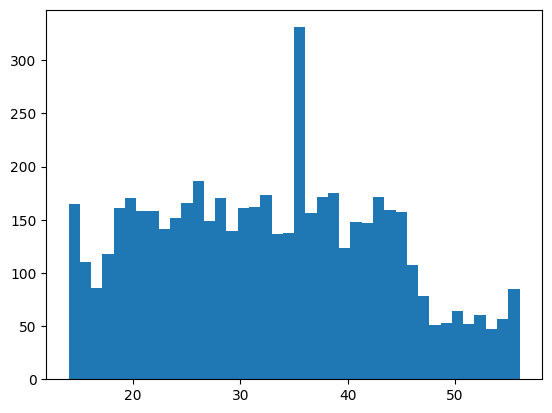

annual_income


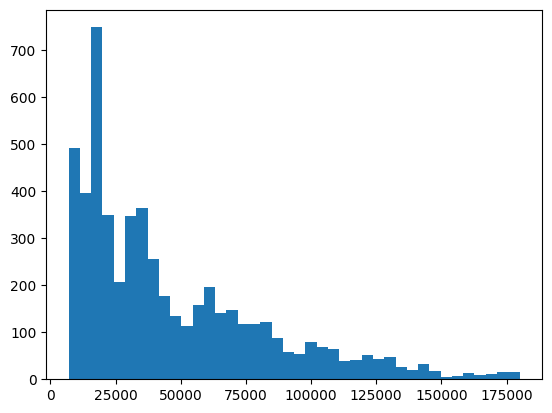

monthly_inhand_salary


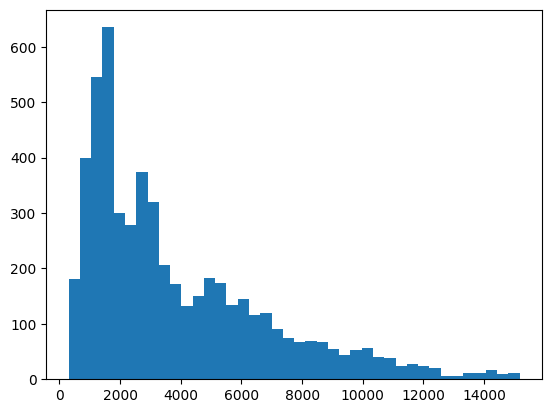

num_bank_accounts


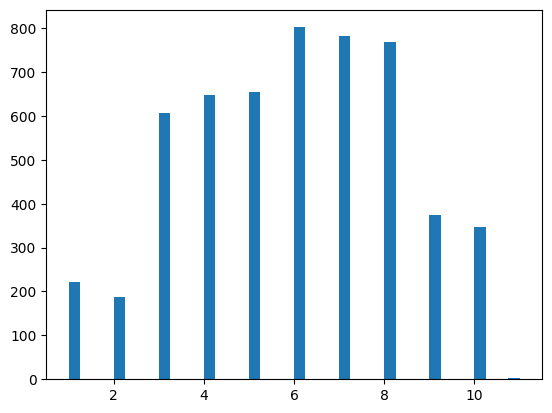

num_credit_card


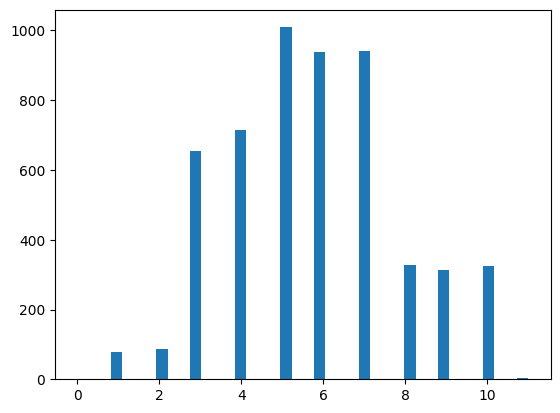

interest_rate


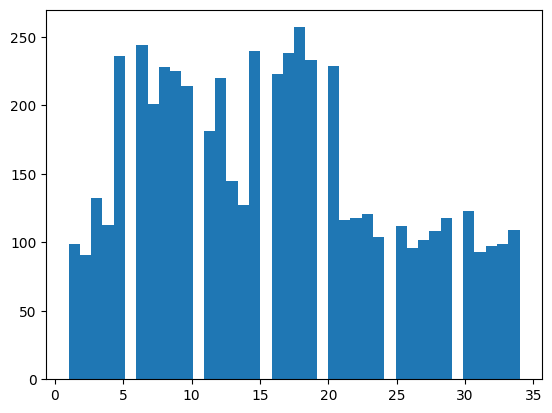

num_of_loan


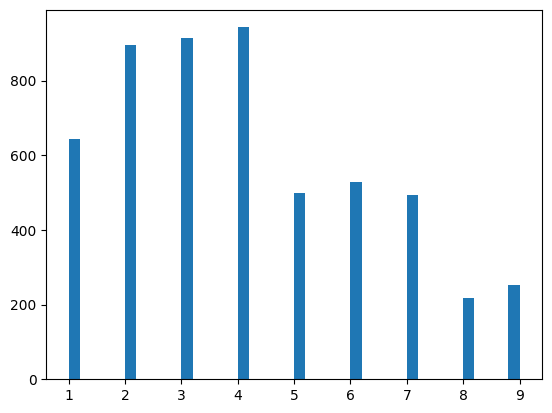

delay_from_due_date


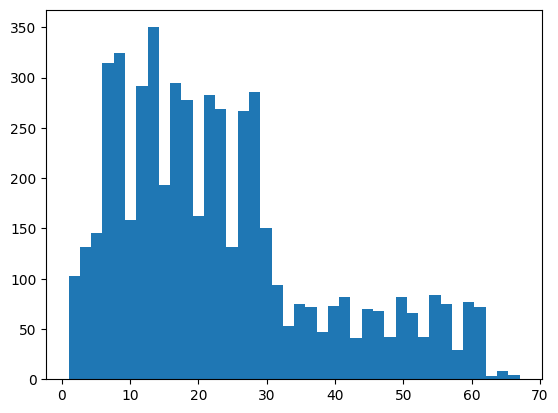

num_of_delayed_payment


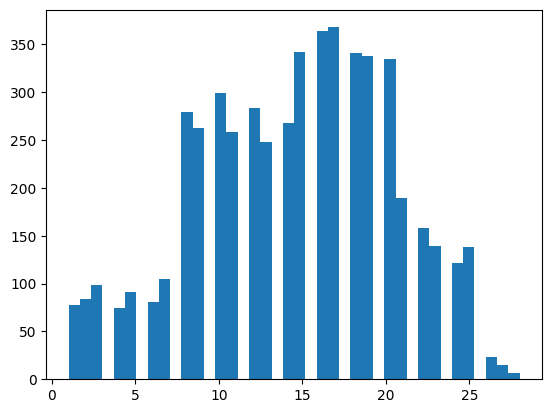

changed_credit_limit


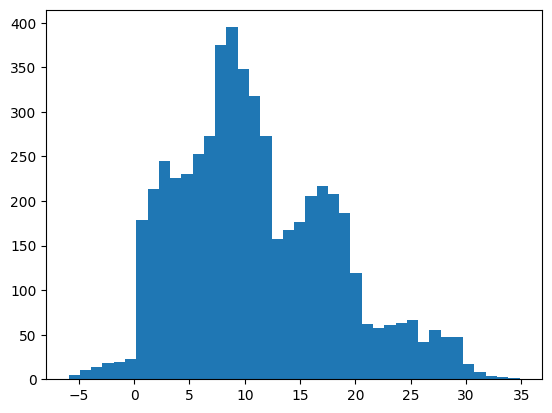

num_credit_inquiries


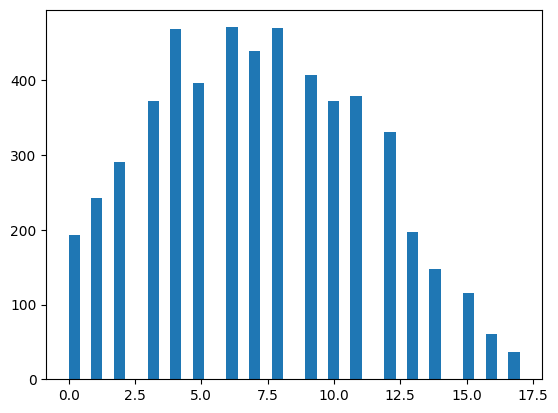

outstanding_debt


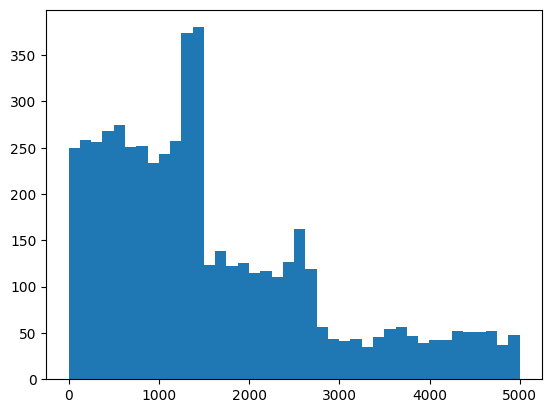

credit_utilization_ratio


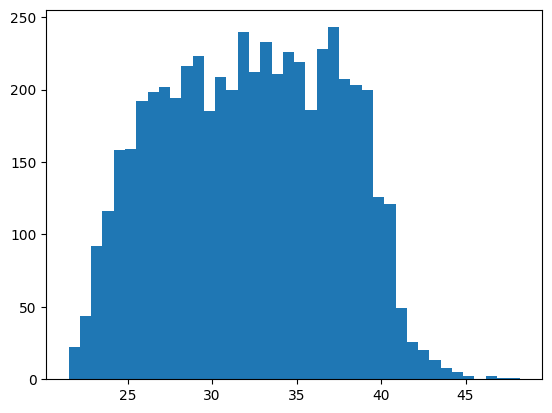

credit_history_age


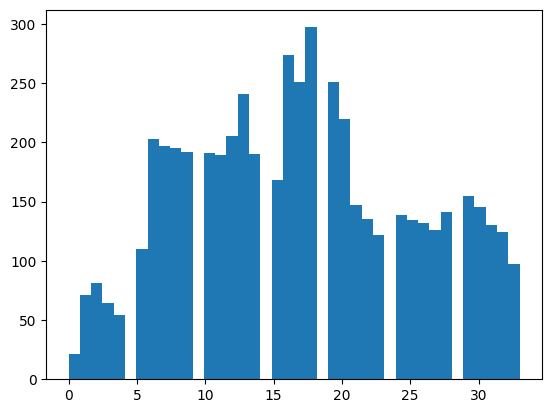

total_emi_per_month


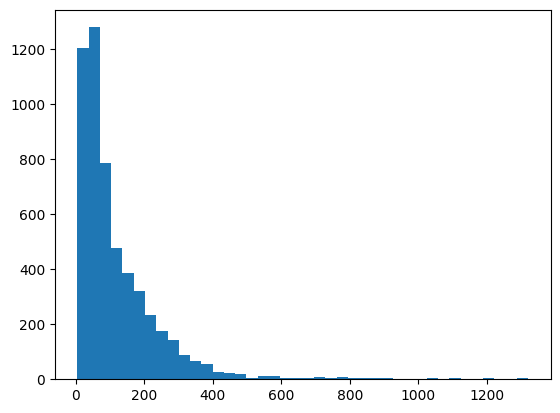

amount_invested_monthly


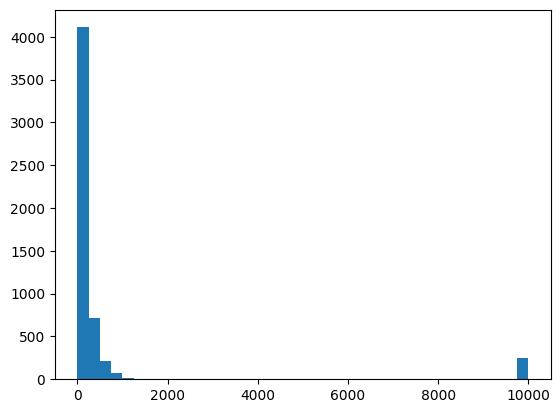

monthly_balance


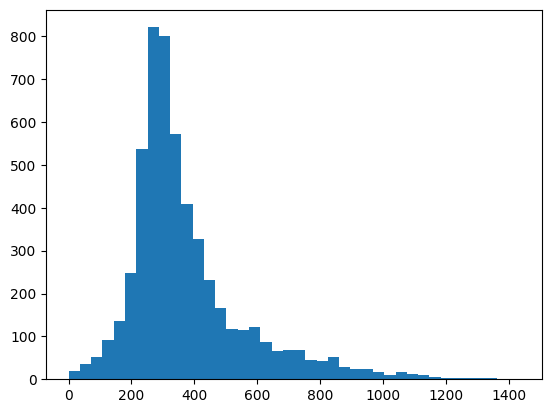

In [ ]:
# Histogramas
df2 = df.dropna()
for x in num_cols:
  print(x)
  plt.hist(df2[x], bins =40)
  plt.show()

In [ ]:
# Balance de clases
print(df[df['credit_score'] == 1].shape)
print(df[df['credit_score'] == 0].shape)

(2426, 22)
(5081, 22)


## 4. Preparación de Datos [0.5 puntos]

En esta sección se prepararán los datos para utilizarlos en los modelos de clasificación. En particular, se cambiará el tipo de algunas columnas, se definirán las transformaciones a aplicar sobre los datos, se tratarán los valores nulos y se separará el dataset en conjuntos de entrenamiento y testeo. Adicionalmente, se crearán nuevas variables para añadir al dataset.

### 4.1 Feature Engineering [Bonus - 0.5 puntos]



Para el feature engineering, primero se crea una variable que indica si una columna posee valores faltantes (1) o no (0). Esto permite matener la información de los datos faltantes tras realizar la imputación.

In [ ]:
# Se crea una columna que toma el valor 1 si la columna original es un na
df['monthly_inhand_salary_na'] = df['monthly_inhand_salary'].apply(lambda x: 1 if pd.isnull(x) else 0)
df['changed_credit_limit_na'] = df['changed_credit_limit'].apply(lambda x: 1 if pd.isnull(x) else 0)
df['credit_history_age_na'] = df['credit_history_age'].apply(lambda x: 1 if pd.isnull(x) else 0)
df['amount_invested_monthly_na'] = df['amount_invested_monthly'].apply(lambda x: 1 if pd.isnull(x) else 0)

Adicionalmente, se crearon indicadores para variables con grandes cantidades de valores atípicos, para ver si la pertenencia a un rango tiene algún impacto adicional.

In [ ]:
# Se crean indicadores para variables con datos atípicos
df['high_amount_invested_monthly'] = df['amount_invested_monthly'].apply(lambda x: 1 if x > 4000 else 0)
df['high_total_emi_per_month'] = df['total_emi_per_month'].apply(lambda x: 1 if x > 400 else 0)

Por último, se creó un ratio del porcentaje del balance mensual invertido, ya que puede dar indicios de la forma que un individuo maneja sus finanzas personales.

In [ ]:
# Ratio inversión
df['invest_ratio_monthly'] = df['amount_invested_monthly'] / df['monthly_balance']

### 4.2 Datos nulos.


En esta sección se revisarán los valores nulos dentro del dataset para decidir si eliminar filas o columnas, o imputar los datos. Para ello, primero se determina la cantidad de valores nulos.

In [ ]:
# Cantidad de valores nulos
df.isna().sum()

customer_id                        0
age                                0
occupation                         0
annual_income                      0
monthly_inhand_salary           1171
num_bank_accounts                  0
num_credit_card                    0
interest_rate                      0
num_of_loan                        0
delay_from_due_date                0
num_of_delayed_payment             0
changed_credit_limit             150
num_credit_inquiries               0
outstanding_debt                   0
credit_utilization_ratio           0
credit_history_age               675
payment_of_min_amount              0
total_emi_per_month                0
amount_invested_monthly          349
payment_behaviour                  0
monthly_balance                    0
credit_score                       0
monthly_inhand_salary_na           0
changed_credit_limit_na            0
credit_history_age_na              0
amount_invested_monthly_na         0
high_amount_invested_monthly       0
h

Se puede observar que la cantidad de datos nulos es baja por lo que decide imputar los datos inicialmente por la media, lo que será implementado dentro del `ColumnTransformer` en la siguiente sección.

### 4.3 Preprocesamiento con `ColumnTransformer`



Primero, se cambia el tipo de la columna `credit_score` para convertirla en categórica.

In [ ]:
# Se cambia el tipo de dato
df['credit_score'] = df['credit_score'].astype('category')

Luego, se genera un `ColumnTransformer` utilizando `OneHotEncoder` para las variables categóricas y `MinMaxScaler` en el caso de las variables numéricas. Se aplica este último escalador para conservar la distribución de las variables en un rango menor.

In [ ]:
# Lista de columnas numéricas y lista de columnas categóricas
num_cols = ['age', 'annual_income', 'monthly_inhand_salary',
            'num_bank_accounts', 'num_credit_card', 'interest_rate',
            'num_of_loan', 'delay_from_due_date', 'num_of_delayed_payment',
            'changed_credit_limit', 'num_credit_inquiries',
            'outstanding_debt', 'credit_utilization_ratio',
            'credit_history_age', 'total_emi_per_month',
            'amount_invested_monthly', 'monthly_balance',
            'invest_ratio_monthly']
cat_cols = ['occupation', 'payment_of_min_amount', 'payment_behaviour']

# Se define el preprocesador para las columnas numéricas
num_transformer = Pipeline(steps=[('imputer', SimpleImputer(strategy='mean')),
    ('scaler', MinMaxScaler())])

# Se define el preprocesador para las columnas categóricas
cat_transformer = Pipeline(steps=[('encoder', OneHotEncoder(sparse = False))])

# Se combinan ambos preprocesadores usando el ColumnTransformer
preprocessor = ColumnTransformer(transformers=[
    ('num', num_transformer, num_cols),
    ('cat', cat_transformer, cat_cols)],
    remainder='passthrough',
    sparse_threshold = 0)

La salida de la transformación debe ser un dataframe de pandas, por lo que se utiliza `set_output` sobre el `ColumnTransformer`.

In [ ]:
# Salida en pandas
preprocessor = preprocessor.set_output(transform="pandas")

Por último, se prueban las transformaciones utilizando `fit_transform`.

In [ ]:
# Pipeline
pipeline = Pipeline(steps=[('preprocessor', preprocessor)])

# Se aplican las transformaciones
df_procesado = pipeline.fit_transform(df.dropna())

# Se visualiza el dataset
df_procesado.head()

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


,num__age,num__annual_income,num__monthly_inhand_salary,num__num_bank_accounts,num__num_credit_card,num__interest_rate,num__num_of_loan,num__delay_from_due_date,num__num_of_delayed_payment,num__changed_credit_limit,...,cat__payment_behaviour_Low_spent_Medium_value_payments,cat__payment_behaviour_Low_spent_Small_value_payments,remainder__customer_id,remainder__credit_score,remainder__monthly_inhand_salary_na,remainder__changed_credit_limit_na,remainder__credit_history_age_na,remainder__amount_invested_monthly_na,remainder__high_amount_invested_monthly,remainder__high_total_emi_per_month
1,0.333333,0.160888,0.183963,0.1,0.363636,0.151515,0.00,0.030303,0.111111,0.278323,...,0.0,1.0,CUS_0x21b1,0,0,0,0,0,0,0
2,0.476190,0.787101,0.799512,0.0,0.454545,0.212121,0.25,0.106061,0.185185,0.319519,...,0.0,0.0,CUS_0x2dbc,0,0,0,0,0,1,0
7,0.380952,0.156457,0.155244,0.7,0.636364,0.424242,0.25,0.439394,0.481481,0.565473,...,0.0,0.0,CUS_0x5407,1,0,0,0,0,0,0
8,0.238095,0.623347,0.641854,0.1,0.454545,0.181818,0.25,0.151515,0.370370,0.347474,...,0.0,0.0,CUS_0x4157,0,0,0,0,0,0,0
12,0.523810,0.273882,0.300267,0.5,0.363636,0.393939,0.25,0.136364,0.259259,0.281265,...,0.0,1.0,CUS_0x3e45,0,0,0,0,0,0,0


### 4.4 Holdout


Finalmente, se separa el dataset en conjuntos de entrenamiento y testeo utilizando `train_test_split`.

In [ ]:
# Se separa el dataset
X = df.drop(columns=['customer_id', 'credit_score'])
y = df.credit_score

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,
                                                    random_state=42)

In [ ]:
#smote_enn = SMOTEENN(random_state=0)
#X_resampled, y_resampled = smote_enn.fit_resample(X_train, y_train)

## 5. Baseline [1.5 puntos]

En esta sección se probarán distintos modelos de clasificación, con el fin de encontrar los dos con la métrica de `F1-score` más alta para la clase 1, para mejorarlos en la siguiente sección. La justificación de la métrica y clase escogida está disponible en la introducción.

Dado lo anterior, se entrenan `Pipeline` que contienen el `ColumnTranformer` creado anteriormente (que contiene además el imputador), y un clasificador. Se utilizan los siguientes modelos de clasificación:

- `Dummy` con estrategia estratificada.
- `LogisticRegression`.
- `KNeighborsClassifier`.
- `DecisionTreeClassifier`
- `SVC`
- `RandomForestClassifier`
- `LightGBMClassifier` (del paquete `lightgbm`)
- `XGBClassifier` (del paquete `xgboost`).

Por último, estos pipeline se utilizan para precedir con el conjunto de testeo y poder evaluar el modelo con `classification_report`. La métrica `F1_score`se guarda en un arreglo para después identificar los mejores modelos.

In [ ]:
# Se definen los modelos
DM = DummyClassifier(strategy = 'stratified', random_state = 0)
LR = LogisticRegression(random_state=0)
KNC = KNeighborsClassifier()
DTC = DecisionTreeClassifier(random_state=0)
Svc = SVC(random_state=0)
RFC = RandomForestClassifier(random_state=0)
LGBMC = LGBMClassifier()
XGBC = XGBClassifier()

In [ ]:
# Lista de modelos
modelos = [DM, LR, KNC, DTC, Svc, RFC, LGBMC, XGBC]

# Lista donde almacenar las métricas
metricas = []

# Se itera sobre los modelos para entrenar y predecir
for i in range(len(modelos)):

  # Inicio del tiempo de ejecución
  start_time = time.time()

  # Entrenamiento
  pipeline = Pipeline(steps=[('preprocessor', preprocessor),
  (f'modelo {modelos[i]}', modelos[i])])
  pipeline.fit(X_train, y_train)

  # Predicción
  y_pred = pipeline.predict(X_test)

  # Fin del tiempo de ejecución
  end_time = time.time()

  # Cálculo del tiempo de ejecución
  execution_time = end_time - start_time

  # Impresión del tiempo de ejecución
  print(f"Tiempo de ejecución: {execution_time:.2f} segundos")

  # Evaluación
  print('\n'*2, f'modelo: {modelos[i]}')
  print(classification_report(y_test, y_pred))

  # Se obtiene el reporte completo con todas las métricas
  report = classification_report(y_test, y_pred, output_dict=True)

  # Se obtiene el F1-score de la clase 1 del reporte
  f1_class_1 = report['1']['f1-score']

  # Se guarada el modelo con su métrica
  metricas.append((modelos[i], f1_class_1))

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


Tiempo de ejecución: 0.04 segundos


 modelo: DummyClassifier(random_state=0, strategy='stratified')
              precision    recall  f1-score   support

           0       0.67      0.68      0.68       996
           1       0.35      0.34      0.35       506

    accuracy                           0.57      1502
   macro avg       0.51      0.51      0.51      1502
weighted avg       0.56      0.57      0.57      1502

Tiempo de ejecución: 0.09 segundos


 modelo: LogisticRegression(random_state=0)
              precision    recall  f1-score   support

           0       0.77      0.86      0.81       996
           1       0.65      0.50      0.56       506

    accuracy                           0.74      1502
   macro avg       0.71      0.68      0.69      1502
weighted avg       0.73      0.74      0.73      1502

Tiempo de ejecución: 0.18 segundos


 modelo: KNeighborsClassifier()
              precision    recall  f1-score   support

           0       0.74      0.81      0

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


Tiempo de ejecución: 0.25 segundos


 modelo: DecisionTreeClassifier(random_state=0)
              precision    recall  f1-score   support

           0       0.75      0.72      0.73       996
           1       0.49      0.53      0.51       506

    accuracy                           0.66      1502
   macro avg       0.62      0.63      0.62      1502
weighted avg       0.66      0.66      0.66      1502



`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


Tiempo de ejecución: 2.53 segundos


 modelo: SVC(random_state=0)
              precision    recall  f1-score   support

           0       0.78      0.87      0.82       996
           1       0.67      0.51      0.58       506

    accuracy                           0.75      1502
   macro avg       0.72      0.69      0.70      1502
weighted avg       0.74      0.75      0.74      1502



`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


Tiempo de ejecución: 1.56 segundos


 modelo: RandomForestClassifier(random_state=0)
              precision    recall  f1-score   support

           0       0.80      0.86      0.83       996
           1       0.68      0.58      0.62       506

    accuracy                           0.77      1502
   macro avg       0.74      0.72      0.73      1502
weighted avg       0.76      0.77      0.76      1502

Tiempo de ejecución: 0.18 segundos


 modelo: LGBMClassifier()


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


              precision    recall  f1-score   support

           0       0.80      0.84      0.82       996
           1       0.66      0.59      0.62       506

    accuracy                           0.76      1502
   macro avg       0.73      0.72      0.72      1502
weighted avg       0.75      0.76      0.76      1502



`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


Tiempo de ejecución: 1.88 segundos


 modelo: XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)
              precision    recall  f1-score   support

           0       0.79      0.84      0.81       996
           1       0.63      0.55      0.59       506

    accuracy                          

Finalmente, se muestran los modelos y sus métricas ordenados de mayor a menor.

In [ ]:
# Modelos
modelos = pd.DataFrame(metricas, columns=['Modelo', 'Métrica'])
modelos = modelos.sort_values(by = 'Métrica', ascending = False)
modelos

,Modelo,Métrica
6,LGBMClassifier(),0.623834
5,"(DecisionTreeClassifier(max_features='sqrt', r...",0.623126
7,"XGBClassifier(base_score=None, booster=None, c...",0.587117
4,SVC(random_state=0),0.578475
1,LogisticRegression(random_state=0),0.564732
3,DecisionTreeClassifier(random_state=0),0.510397
2,KNeighborsClassifier(),0.491839
0,"DummyClassifier(random_state=0, strategy='stra...",0.348697


In [ ]:
# Modelos
for i in metricas:
  print(i)

(DummyClassifier(random_state=0, strategy='stratified'), 0.3486973947895792)
(LogisticRegression(random_state=0), 0.5647321428571429)
(KNeighborsClassifier(), 0.49183895538628947)
(DecisionTreeClassifier(random_state=0), 0.5103969754253308)
(SVC(random_state=0), 0.5784753363228701)
(RandomForestClassifier(random_state=0), 0.6231263383297645)
(LGBMClassifier(), 0.6238341968911918)
(XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_const

Se tiene que todos los modelos entrenados son mejores que el azar (`Dummy`). En particular, se puede observar que `LGBMClassifier`y `RandomForestClassifier` son los que obtienen los mejores resultados, con un `F1-score` de 0.62 aproximadamente.

En esta línea, se comenta que estos modelos de tipo ensemble combinan múltiples modelos de forma de reducir el sesgo y la varianza en la predicción. Por otra parte, `LogisticRegression`, `DecisionTree` y `SVC` pueden tener dificultades para aprender patrones de clases minoritarias en conjuntos de datos desbalanceados.

Con respecto al tiempo de entrenamiento, se comenta que todos los modelos se ejecutan en menos de 3 segundos por lo que debería ser factible realizar una búsqueda de hiperparámetros en cualquiera de ellos.

## 6. Optimización del Modelo [1.5 puntos]

En esta sección se buscará mejorar la clasificación encontando mejores combinaciones de hiperparámetos o algoritmos. Para ello, primero se definen dos nuevos `Pipeline`, que utilizan el primer y segundo mejor modelo encontrados en la sección anterior. Adicionalmente, se agrega un paso para seleccionar características utilizando `SelectPercentile`.

In [ ]:
# Selección de características
select = SelectPercentile(score_func = f_classif, percentile = 90)

# Se definen los pipelines
pipeline_lgbm = Pipeline(steps = [('preprocessor', preprocessor),
                                  ('features', select),
                                  ('classifier', LGBMC),
                                  ],
                          memory = '.')

pipeline_rf = Pipeline(steps = [('preprocessor', preprocessor),
                                ('features', select),
                                ('classifier', RFC)
                                ],
                       memory = '.')

A continuación, se definen los parámetros para cada uno de los `Pipeline` que se probarán para mejorar la clasificación.

In [ ]:
# LGBM Classifier
params_lgbm = {'preprocessor__num__imputer__strategy': ['mean', 'median', 'most_frequent'],
               'classifier__num_leaves': [50, 100, 150],
               'classifier__learning_rate': [0.01, 0.1, 0.2],
               'classifier__max_depth': [-1, 10, 20],
               'features__percentile': [20, 40, 60, 80]
               }

# Random Forest Classifier
params_rf = {'preprocessor__num__imputer__strategy': ['mean', 'median', 'most_frequent'],
             'classifier__n_estimators' : [200, 250, 300],
             'classifier__max_depth': [5, 10, 15],
             'classifier__max_features': ['auto', 'sqrt'],
             'features__percentile': [20, 40, 60, 80]
            }

Luego, se realiza la búsqueda de hiperparámetros para cada uno de los `Pipelines` creados.

In [ ]:
# F1-score clase 1
def f1_minority(y_true, y_pred):
    return f1_score(y_true, y_pred, pos_label=1)

# Crear el objeto scorer utilizando la función personalizada
scorer = make_scorer(f1_minority)

In [ ]:
# Búsqueda para LGBM
search_lgbmc = HalvingGridSearchCV(estimator = pipeline_lgbm,
                             param_grid = params_lgbm,
                             verbose = 10,
                             scoring = scorer).fit(X_train, y_train)

n_iterations: 6
n_required_iterations: 6
n_possible_iterations: 6
min_resources_: 24
max_resources_: 6005
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 324
n_resources: 24
Fitting 5 folds for each of 324 candidates, totalling 1620 fits
[CV 1/5; 1/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
Features [42 45] are constant.
invalid value encountered in true_divide
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packa

[CV 1/5; 1/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.3s
[CV 2/5; 1/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 1/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.3s
[CV 3/5; 1/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 1/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   1.1s
[CV 4/5; 1/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 1/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 5/5; 1/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 5/5; 1/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) to

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 2/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 2/5; 2/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 2/5; 2/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 2/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 2/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, te

Features [39 43] are constant.
invalid value encountered in true_divide
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py",

[CV 4/5; 2/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 5/5; 2/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 5/5; 2/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 3/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 3/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(t

Features [40 41 42 43 44] are constant.
invalid value encountered in true_divide
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_ou

[CV 2/5; 3/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 3/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 3/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 3/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 3/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mos

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
Features [39 40 42] are constant.
invalid value encountered in true_divide
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-pa

[CV 5/5; 3/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 4/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 1/5; 4/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 4/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 2/5; 4/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, tes

Features [39 43] are constant.
invalid value encountered in true_divide
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py",

[CV 5/5; 4/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 5/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 1/5; 5/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 5/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 2/5; 5/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 5/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 6/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 6/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 6/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 6/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequ

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 6/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 7/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 1/5; 7/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 7/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 2/5; 7/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, tes

Features [38 41] are constant.
invalid value encountered in true_divide
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py",

[CV 5/5; 7/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 8/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 1/5; 8/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 8/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 2/5; 8/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test

Features [38 41] are constant.
invalid value encountered in true_divide
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py",

[CV 5/5; 8/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 9/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 9/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 9/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 9/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequ

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 9/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 9/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 9/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 10/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 1/5; 10/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, sco

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 10/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 10/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 5/5; 10/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 11/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 1/5; 11/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, tes

Features [42 45] are constant.
invalid value encountered in true_divide
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py",

[CV 4/5; 11/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 11/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 5/5; 11/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 12/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 12/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, sco

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 12/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 12/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 12/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 13/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 1/5; 13/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;

Features [39 40 42] are constant.
invalid value encountered in true_divide
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.p

[CV 1/5; 14/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 14/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 2/5; 14/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 14/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 14/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 15/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 15/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 15/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 15/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 15/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 17/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 17/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 2/5; 17/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 17/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 17/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 18/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 18/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 18/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 18/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 18/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 20/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 20/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 2/5; 20/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 20/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 20/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 22/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 23/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 1/5; 23/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 23/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 2/5; 23/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 24/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 24/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 24/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 24/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 24/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 25/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 26/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 1/5; 26/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 26/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 2/5; 26/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 27/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 27/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 27/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 27/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 27/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 28/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 28/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 5/5; 28/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 29/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 1/5; 29/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 30/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 30/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 30/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 30/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 30/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 31/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 31/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 31/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 31/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 5/5; 31/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 32/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 33/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 33/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 33/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 33/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F


[CV 2/5; 34/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 2/5; 34/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 34/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 34/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 34/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 34/324] END 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 35/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 35/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 35/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 35/324] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 5/5; 35/324] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F


[CV 1/5; 37/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 1/5; 37/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 37/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 2/5; 37/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 37/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 37/324] END class

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 38/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 38/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 38/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 38/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 38/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.00

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 39/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 39/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 39/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 40/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 1/5; 40/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 41/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 1/5; 41/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 41/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 2/5; 41/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 41/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 41/324] 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 42/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 42/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 42/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 42/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 42/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 43/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 43/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 5/5; 43/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 44/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 1/5; 44/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, tes

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 45/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 45/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 45/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 45/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 45/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 46/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 46/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 46/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 46/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 5/5; 46/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=na

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 47/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 48/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 48/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 48/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 48/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 49/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 49/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 49/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 49/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 5/5; 49/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 50/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 51/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 51/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 51/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 51/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 52/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 52/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 52/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 52/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 4/5; 52/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 53/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 53/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 5/5; 53/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 54/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 54/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 55/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 55/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 2/5; 55/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 55/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 55/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 56/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 56/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 56/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 56/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 5/5; 56/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 57/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 57/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 57/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 57/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 57/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 58/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.6s
[CV 3/5; 58/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 58/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.5s
[CV 4/5; 58/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 58/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.2s
[CV 5/5; 58/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 5/5; 58/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 59/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 1/5; 59/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 59/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 59/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 59/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 59/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 59/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 60/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 60/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 60/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 61/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 1/5; 61/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=me

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 62/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 62/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 2/5; 62/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 62/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 62/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 63/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 63/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 63/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 63/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 63/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 64/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 65/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 1/5; 65/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 65/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 2/5; 65/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 66/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 66/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 66/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 66/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 66/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 67/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 67/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 5/5; 67/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 68/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 1/5; 68/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 69/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 69/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 69/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 69/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 69/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 70/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 70/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 5/5; 70/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 71/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 1/5; 71/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 72/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 72/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 72/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 72/324] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 72/324] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 73/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 73/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 73/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 73/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 5/5; 73/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=na

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 76/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 76/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 76/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 76/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 4/5; 76/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=na

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 79/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 79/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 2/5; 79/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 79/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 79/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=na

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 80/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 80/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 80/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 80/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 5/5; 80/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.00

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 82/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 82/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 2/5; 82/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 82/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 82/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=na

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 83/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 83/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 83/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 83/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 5/5; 83/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.00

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 84/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 84/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 84/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 85/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 1/5; 85/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 85/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 86/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 1/5; 86/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 86/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 2/5; 86/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 87/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 87/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 87/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 87/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 87/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 88/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 88/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 4/5; 88/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 88/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 5/5; 88/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 91/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 91/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 2/5; 91/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 91/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 91/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 92/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 92/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 92/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 92/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 5/5; 92/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 94/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 94/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 2/5; 94/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 94/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 94/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 97/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 97/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 2/5; 97/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 97/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 97/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 98/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 98/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 98/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 98/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 5/5; 98/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 99/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 100/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 1/5; 100/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 100/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 2/5; 100/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(tr

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 101/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 101/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 101/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 101/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 4/5; 101/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 102/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 102/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 102/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 103/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 1/5; 103/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strate

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 104/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 104/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 2/5; 104/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 104/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 104/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 105/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 105/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 105/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 105/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 105/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__impute

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 106/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 107/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 1/5; 107/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 107/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 2/5; 107/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(tr

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 108/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 108/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 108/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 108/324] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 108/324] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__impu

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 109/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 109/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 109/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 109/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 5/5; 109/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=na

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 110/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 111/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 111/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 111/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 111/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 112/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 112/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 2/5; 112/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 112/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 112/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=na

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 113/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 113/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 4/5; 113/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 113/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 5/5; 113/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.00

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 114/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 115/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 1/5; 115/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 115/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 2/5; 115/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 116/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 116/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 116/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 116/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 5/5; 116/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.00

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 117/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 118/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 1/5; 118/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 118/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 2/5; 118/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 119/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 119/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 119/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 119/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 119/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.00

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 120/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 5/5; 120/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 120/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 121/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 1/5; 121/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 122/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 122/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 122/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.9s
[CV 3/5; 122/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 122/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 122/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 122/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.8s
[CV 5/5; 122/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 5/5; 122/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 123/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 123/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 123/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 123/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 123/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 123/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 123/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 124/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 124/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 5/5; 124/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 125/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 1/5; 125/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 126/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 126/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 126/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 126/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 126/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 127/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 127/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 127/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 127/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 5/5; 127/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 128/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 129/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 129/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 129/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 129/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 130/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 130/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 130/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 130/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 5/5; 130/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 131/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 132/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 132/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 132/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 132/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 133/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 133/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 2/5; 133/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 133/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 133/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 134/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 134/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 134/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 134/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 134/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 135/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 135/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 135/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 135/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 135/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 136/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 137/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 1/5; 137/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 137/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 2/5; 137/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 138/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 138/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 138/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 138/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 138/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 139/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 139/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 5/5; 139/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 140/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 1/5; 140/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 142/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 2/5; 142/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 2/5; 142/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 142/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 142/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 143/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 143/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 5/5; 143/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 144/324] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 144/324] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 145/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 2/5; 145/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 2/5; 145/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 145/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 145/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=na

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 146/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 146/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 5/5; 146/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 147/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 147/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, sco

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 147/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 148/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 1/5; 148/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 148/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 2/5; 148/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 150/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 150/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 150/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 5/5; 150/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 150/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 151/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 151/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 5/5; 151/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 152/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 1/5; 152/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, tes

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 152/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 152/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 5/5; 152/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 153/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 153/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, sco

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 153/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 154/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 1/5; 154/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 154/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 2/5; 154/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 155/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 155/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 2/5; 155/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 155/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 155/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.00

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 156/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 156/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 156/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 156/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 156/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 157/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 157/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 157/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 157/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 5/5; 157/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 158/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 158/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 5/5; 158/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 159/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 159/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 159/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 160/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 1/5; 160/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 160/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 2/5; 160/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 160/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 161/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 1/5; 161/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 161/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 2/5; 161/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 161/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.2s
[CV 1/5; 162/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 162/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 162/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 162/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 163/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 163/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 163/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 163/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 163/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F


[CV 2/5; 164/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 2/5; 164/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 164/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 164/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 164/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 16

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 164/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 165/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 165/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 165/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 165/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 165/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 166/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 1/5; 166/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 166/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 2/5; 166/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 167/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.3s
[CV 2/5; 167/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 2/5; 167/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 167/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 167/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 168/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.2s
[CV 4/5; 168/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 168/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 168/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 168/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 170/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 2/5; 170/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 2/5; 170/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 170/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 170/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.2s
[CV 4/5; 170/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 170/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 5/5; 170/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 170/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 171/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 171/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 171/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 171/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.2s
[CV 3/5; 171/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 171/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 171/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 171/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.3s
[CV 5/5; 171/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 171/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 172/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 172/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.2s
[CV 2/5; 172/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 172/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.5s
[CV 3/5; 172/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 172/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 172/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 4/5; 172/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 172/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.5s
[CV 1/5; 173/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 173/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.5s
[CV 2/5; 173/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 2/5; 173/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 173/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 173/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.5s
[CV 4/5; 173/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 4/5; 173/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 173/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 5/5; 173/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 174/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.2s
[CV 4/5; 174/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 174/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.2s
[CV 5/5; 174/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 174/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 175/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 175/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 2/5; 175/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 2/5; 175/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 175/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 175/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 175/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 176/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 176/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.5s
[CV 2/5; 176/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 2/5; 176/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 176/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 176/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 176/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.4s
[CV 5/5; 176/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 176/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.3s
[CV 1/5; 177/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 177/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.3s
[CV 2/5; 177/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 177/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 177/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 177/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 177/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 177/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.2s
[CV 5/5; 177/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 177/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 178/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 178/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.3s
[CV 2/5; 178/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 2/5; 178/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 178/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 178/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.3s
[CV 4/5; 178/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 178/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.2s
[CV 5/5; 178/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 5/5; 178/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 179/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 1/5; 179/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 179/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 180/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 180/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 180/324] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 180/324] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 181/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 2/5; 181/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 2/5; 181/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 181/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 181/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=na

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 182/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 182/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 182/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 182/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 182/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.00

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 183/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 183/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 183/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 183/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 183/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 184/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 184/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 5/5; 184/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 185/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 1/5; 185/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, tes

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 186/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 186/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 186/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 186/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 186/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 187/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 187/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 187/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 187/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 187/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=na

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 188/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 188/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 188/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 5/5; 188/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 189/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 1

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 189/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 189/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 189/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 189/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 189/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F


[CV 5/5; 190/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 5/5; 190/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 191/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 1/5; 191/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 191/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 2/5; 191/324] EN

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 192/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 193/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 1/5; 193/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 193/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 2/5; 193/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 194/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 194/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 2/5; 194/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 194/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 194/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 195/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 195/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 195/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 195/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 195/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F


[CV 3/5; 196/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 196/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 196/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 4/5; 196/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 196/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 5/5; 196/324] END

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 197/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 197/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 197/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 197/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 4/5; 197/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 198/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 198/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 198/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 198/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 198/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 199/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 200/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 1/5; 200/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 200/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 2/5; 200/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 201/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 201/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 201/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 201/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 201/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 202/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 202/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 202/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 202/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 202/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 203/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 203/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 203/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 203/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 203/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 204/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 204/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 204/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 204/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 204/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 205/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 205/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   1.3s
[CV 3/5; 205/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 205/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.6s
[CV 4/5; 205/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 205/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 205/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 5/5; 205/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 206/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 206/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 206/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.3s
[CV 4/5; 206/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 206/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 206/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 5/5; 206/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 207/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 207/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 207/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 207/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 207/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 208/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.3s
[CV 2/5; 208/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 2/5; 208/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 208/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 208/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.7s
[CV 4/5; 208/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 4/5; 208/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 208/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 5/5; 208/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 209/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.3s
[CV 2/5; 209/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 2/5; 209/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 209/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 209/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 209/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.3s
[CV 1/5; 210/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 210/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 210/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 210/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 211/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 211/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 211/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 211/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 211/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 212/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 212/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 212/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 212/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 5/5; 212/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 213/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 213/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 213/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 214/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 1/5; 214/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=me

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 214/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 215/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 1/5; 215/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 215/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 2/5; 215/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 216/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 216/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 216/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 216/324] START classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 216/324] END classifier__learning_rate=0.1, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 218/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 218/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 218/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 5/5; 218/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 5/5; 218/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.00

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 219/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 219/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 219/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 220/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 1/5; 220/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 220/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 221/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 1/5; 221/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 221/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 2/5; 221/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000,

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 222/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 2/5; 222/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 222/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 222/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 222/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 223/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 223/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 2/5; 223/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 223/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 223/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=na

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 224/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 224/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 2/5; 224/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 224/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 224/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.00

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 225/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 225/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 225/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 225/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 225/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 226/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 226/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 226/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 226/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 5/5; 226/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=na

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 227/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 5/5; 227/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 5/5; 227/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 228/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 228/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, sco

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 228/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 229/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 1/5; 229/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 229/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 2/5; 229/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 229/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 230/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 1/5; 230/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 230/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 2/5; 230/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 230/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 231/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 231/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 231/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 231/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 232/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 232/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 2/5; 232/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 232/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 232/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 233/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 233/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 2/5; 233/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 233/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 233/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 234/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 234/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 234/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 234/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 234/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 235/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 235/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 235/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 235/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 5/5; 235/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 236/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 236/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 5/5; 236/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 237/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 237/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 237/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 237/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 237/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 237/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 237/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 238/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 238/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 238/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 238/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 5/5; 238/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 239/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 240/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 240/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 2/5; 240/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 240/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 240/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 5/5; 240/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 240/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 241/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 1/5; 241/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=me

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 242/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 242/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 2/5; 242/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 242/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 242/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 242/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 243/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 243/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 243/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 243/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 243/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 244/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 1/5; 244/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 244/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 2/5; 244/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 246/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 2/5; 246/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 246/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 246/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 246/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 247/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.2s
[CV 3/5; 247/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 247/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.5s
[CV 4/5; 247/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 247/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 247/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 5/5; 247/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 248/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.9s
[CV 2/5; 248/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 248/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.3s
[CV 3/5; 248/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 248/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 248/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 248/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 249/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 249/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 249/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 249/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 249/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 250/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 250/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 2/5; 250/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 250/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 250/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 251/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 1/5; 251/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 251/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 2/5; 251/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 251/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 251

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 251/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 251/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 5/5; 251/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 252/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 252/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 252/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 252/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 252/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 252/324] START classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 252/324] END classifier__learning_rate=0.2, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 254/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 254/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 5/5; 254/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 255/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 255/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, sco

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 255/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 255/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 255/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 255/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 255/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 256/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 256/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 4/5; 256/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 5/5; 256/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 5/5; 256/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=na

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 257/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 257/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 4/5; 257/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 5/5; 257/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 5/5; 257/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.00

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 258/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 258/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 258/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 258/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 258/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 259/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 259/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 259/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 259/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 259/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=na

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 260/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 261/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 261/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 261/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 261/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 262/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 262/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 2/5; 262/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 262/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 262/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=na

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 263/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 263/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 263/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 263/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 263/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.00

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 264/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 264/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 264/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 264/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 264/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 265/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 265/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 265/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 265/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 265/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 266/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 267/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 267/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 267/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 267/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 268/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 268/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 4/5; 268/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 5/5; 268/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 5/5; 268/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 269/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 269/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 4/5; 269/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 269/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 5/5; 269/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 270/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 270/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 270/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 270/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 270/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 271/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 271/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 271/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 271/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 271/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 272/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 272/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 272/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 272/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 5/5; 272/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 273/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 273/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 273/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 5/5; 273/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 273/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 274/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 274/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 274/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 274/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 5/5; 274/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 276/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 5/5; 276/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 276/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 277/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 1/5; 277/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=me

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 278/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 278/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 2/5; 278/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 278/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 278/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 279/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 279/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 279/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 279/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 279/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 279/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 280/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 1/5; 280/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 280/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 2/5; 280/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 280/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 281/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 1/5; 281/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 2/5; 281/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 2/5; 281/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 281/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 5/5; 281/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 5/5; 281/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 282/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 282/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 283/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 283/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 2/5; 283/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 283/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 283/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 284/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 284/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 2/5; 284/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 284/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 284/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 285/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 285/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 285/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 285/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 285/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 285/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 286/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 1/5; 286/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 286/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 2/5; 286/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 287/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 287/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 287/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 287/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 287/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 288/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 5/5; 288/324] START classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 288/324] END classifier__learning_rate=0.2, classifier__max_depth=10, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 289/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 1/5; 289/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 291/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 291/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 291/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 291/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 291/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 292/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 292/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 292/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 292/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 4/5; 292/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=na

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 293/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 294/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 294/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 294/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 294/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 295/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 295/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 5/5; 295/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 296/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 1/5; 296/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, tes

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 296/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 296/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 296/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 296/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 5/5; 296/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.00

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 297/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 297/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 297/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 297/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 297/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 298/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 298/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 2/5; 298/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 298/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 298/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=na

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 299/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 299/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 2/5; 299/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 299/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 299/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.00

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 299/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 300/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 300/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 300/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 300/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 300/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.6s
[CV 5/5; 300/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 300/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 301/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 301/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.5s
[CV 2/5; 301/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 301/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.8s
[CV 3/5; 301/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 301/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 301/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 301/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 302/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 302/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 5/5; 302/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 303/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 303/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 303/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 303/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 303/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 304/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 1/5; 304/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=me

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 304/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 304/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 5/5; 304/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 305/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 1/5; 305/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 305/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 305/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 4/5; 305/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 5/5; 305/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 5/5; 305/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 306/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 306/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 306/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 306/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 306/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 307/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 307/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 307/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 307/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 307/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 308/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 309/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 309/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 309/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 309/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 311/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 311/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 311/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 311/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 311/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 312/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 312/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 312/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 312/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 312/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 313/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 313/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 2/5; 313/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 313/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 313/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 314/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 2/5; 314/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 2/5; 314/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 314/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 314/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 315/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 315/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 315/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 315/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 315/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F


[CV 1/5; 316/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 1/5; 316/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 2/5; 316/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 2/5; 316/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 316/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 316/324] END

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 316/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 317/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 1/5; 317/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 317/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 2/5; 317/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 317/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 317/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 5/5; 317/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 318/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 318/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 318/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 5/5; 318/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 318/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 1/5; 319/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 1/5; 319/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=me

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 319/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.2s
[CV 1/5; 320/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 1/5; 320/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 320/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 2/5; 320/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 321/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.2s
[CV 3/5; 321/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 321/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 321/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 321/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 322/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 1/5; 323/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 1/5; 323/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 2/5; 323/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 2/5; 323/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 324/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 324/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 324/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 324/324] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 324/324] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__st

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
Features [44] are constant.
invalid value encountered in true_divide
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages

[CV 4/5; 1/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.737, test=0.364) total time=   0.1s
[CV 5/5; 1/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 5/5; 1/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.629, test=nan) total time=   0.1s
[CV 1/5; 2/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 2/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.711, test=0.500) total time=   0.1s
[CV 2/5; 2/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 2/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 2/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
Features [44] are constant.
invalid value encountered in true_divide
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages

[CV 3/5; 2/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 2/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 2/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.755, test=0.000) total time=   0.1s
[CV 5/5; 2/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 2/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.629, test=nan) total time=   0.1s
[CV 1/5; 3/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 1/5; 3/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.711, test=0.500) total time=   0.1s
[CV 2/5; 3/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 3/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 3/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 3/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 3/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median


Features [45] are constant.
invalid value encountered in true_divide
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 4/5; 3/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.737, test=0.364) total time=   0.1s
[CV 5/5; 3/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 5/5; 3/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.629, test=nan) total time=   0.1s
[CV 1/5; 4/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 4/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 4/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 4/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 4/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 4/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 4/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mos

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 4/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.629, test=nan) total time=   0.1s
[CV 1/5; 5/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 1/5; 5/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.711, test=0.500) total time=   0.1s
[CV 2/5; 5/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 2/5; 5/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.00

Features [44] are constant.
invalid value encountered in true_divide
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", li

[CV 3/5; 5/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 5/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 5/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.737, test=0.364) total time=   0.1s
[CV 5/5; 5/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 5/5; 5/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.629, test=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 6/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.711, test=0.500) total time=   0.1s
[CV 2/5; 6/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 2/5; 6/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 6/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 6/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 6/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.737, test=0.364) total time=   0.1s
[CV 5/5; 6/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 5/5; 6/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.629, test=nan) total time=   0.1s
[CV 1/5; 7/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 7/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, s

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 7/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 7/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 7/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 7/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 7/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 8/108] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 8/108] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 8/108] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 8/108] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 8/108] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.737, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 9/108] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 9/108] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 9/108] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 9/108] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 9/108] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.737, test=0.364) total time=   0.1s
[CV 5/5; 9/108] START classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 5/5; 9/108] END classifier__learning_rate=0.01, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.629, test=nan) total time=   0.1s
[CV 1/5; 10/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 10/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.711, test=0.500) total time=   0.1s
[CV 2/5; 10/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


invalid value encountered in true_divide
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_

[CV 2/5; 10/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.7s
[CV 3/5; 10/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 10/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 10/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 10/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 11/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.711, test=0.500) total time=   0.1s
[CV 2/5; 11/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median


Features [44] are constant.
invalid value encountered in true_divide
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", li

[CV 2/5; 11/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.5s
[CV 3/5; 11/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 11/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.8s
[CV 4/5; 11/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 11/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.737, test=0.364) total time=   0.1s
[CV 5/5; 11/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 5/5; 11/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 12/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 12/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 12/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 12/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 12/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.737, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 12/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.629, test=nan) total time=   0.1s
[CV 1/5; 13/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 13/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.711, test=0.500) total time=   0.0s
[CV 2/5; 13/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 13/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 13/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 13/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 13/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.708, test=0.250) total time=   0.1s
[CV 5/5; 13/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 13/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 15/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.711, test=0.500) total time=   0.1s
[CV 2/5; 15/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 2/5; 15/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 15/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 15/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 16/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.711, test=0.500) total time=   0.1s
[CV 2/5; 16/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 16/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 16/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 16/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__

Features [44] are constant.
invalid value encountered in true_divide
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", li

[CV 4/5; 16/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.755, test=0.000) total time=   0.2s
[CV 5/5; 16/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 16/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.629, test=nan) total time=   0.0s
[CV 1/5; 17/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 1/5; 17/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 17/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.2s
[CV 4/5; 17/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 4/5; 17/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.737, test=0.364) total time=   0.0s
[CV 5/5; 17/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 5/5; 17/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 19/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.711, test=0.500) total time=   0.0s
[CV 2/5; 19/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 19/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 19/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 19/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 19/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.755, test=0.000) total time=   0.0s
[CV 5/5; 19/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 19/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.629, test=nan) total time=   0.1s
[CV 1/5; 20/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 1/5; 20/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 20/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 20/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 20/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.737, test=0.364) total time=   0.1s
[CV 5/5; 20/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 5/5; 20/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 21/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.667, test=0.400) total time=   0.2s
[CV 2/5; 21/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 2/5; 21/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 21/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 21/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 21/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.629, test=nan) total time=   0.0s
[CV 1/5; 22/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 22/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.711, test=0.500) total time=   0.0s
[CV 2/5; 22/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 22/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 22/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.708, test=0.250) total time=   0.0s
[CV 5/5; 22/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 22/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.629, test=nan) total time=   0.1s
[CV 1/5; 23/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 1/5; 23/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 23/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 23/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 23/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 23/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 23/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 24/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 24/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 24/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 24/108] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 24/108] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.737, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F


[CV 1/5; 25/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 1/5; 25/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.711, test=0.500) total time=   0.1s
[CV 2/5; 25/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 2/5; 25/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 25/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 25/108] END cla

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 26/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 26/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 26/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 26/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 26/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.73

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F


[CV 1/5; 27/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 27/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.711, test=0.500) total time=   0.1s
[CV 2/5; 27/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 27/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 27/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 27/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 27/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 27/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 28/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 28/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 28/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 28/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 28/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.737, test=0.

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 29/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.816, test=0.000) total time=   0.0s
[CV 5/5; 29/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 5/5; 29/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.842, test=nan) total time=   0.1s
[CV 1/5; 30/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 30/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 30/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.815, test=nan) total time=   0.0s
[CV 3/5; 30/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 30/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.923, test=nan) total time=   0.1s
[CV 4/5; 30/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 30/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 31/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.811, test=nan) total time=   0.0s
[CV 1/5; 32/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 1/5; 32/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.818, test=0.500) total time=   0.1s
[CV 2/5; 32/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 2/5; 32/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.857, tes

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 32/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.923, test=nan) total time=   0.0s
[CV 4/5; 32/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 4/5; 32/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.816, test=0.000) total time=   0.0s
[CV 5/5; 32/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 5/5; 32/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.842, test=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 33/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.720, test=nan) total time=   0.2s
[CV 3/5; 33/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 33/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.867, test=nan) total time=   0.0s
[CV 4/5; 33/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 33/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 34/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.897, test=nan) total time=   0.0s
[CV 4/5; 34/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 34/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.784, test=0.222) total time=   0.0s
[CV 5/5; 34/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 5/5; 34/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 36/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.864, test=0.545) total time=   0.1s
[CV 2/5; 36/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 2/5; 36/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.846, test=nan) total time=   0.0s
[CV 3/5; 36/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 36/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 37/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.864, test=0.545) total time=   0.0s
[CV 2/5; 37/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 37/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.815, test=nan) total time=   0.0s
[CV 3/5; 37/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 37/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strat

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 38/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.844, test=0.600) total time=   0.2s
[CV 2/5; 38/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 2/5; 38/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.769, test=nan) total time=   0.0s
[CV 3/5; 38/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 38/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.963, test=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 39/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.815, test=nan) total time=   0.0s
[CV 3/5; 39/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 39/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.923, test=nan) total time=   0.0s
[CV 4/5; 39/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 39/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 40/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.864, test=0.545) total time=   0.0s
[CV 2/5; 40/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 2/5; 40/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.846, test=nan) total time=   0.1s
[CV 3/5; 40/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 40/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 40/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.821, test=nan) total time=   0.1s
[CV 1/5; 41/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 1/5; 41/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.791, test=0.545) total time=   0.0s
[CV 2/5; 41/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 2/5; 41/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.769, tes

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 41/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.842, test=nan) total time=   0.0s
[CV 1/5; 42/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 42/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.810, test=0.545) total time=   0.1s
[CV 2/5; 42/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 42/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 42/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.923, test=nan) total time=   0.1s
[CV 4/5; 42/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 42/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.792, test=0.000) total time=   0.0s
[CV 5/5; 42/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 42/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strat

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 43/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.810, test=0.545) total time=   0.1s
[CV 2/5; 43/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 2/5; 43/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.769, test=nan) total time=   0.0s
[CV 3/5; 43/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 43/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 43/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.766, test=0.000) total time=   0.1s
[CV 5/5; 43/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 43/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.811, test=nan) total time=   0.4s
[CV 1/5; 44/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 1/5; 44/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.818, test=0.500) total time=   0.2s
[CV 2/5; 44/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 2/5; 44/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.857, tes

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 44/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.816, test=0.000) total time=   0.1s
[CV 5/5; 44/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 5/5; 44/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.842, test=nan) total time=   0.1s
[CV 1/5; 45/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 1/5; 45/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.864, t

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 45/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.846, test=nan) total time=   0.0s
[CV 3/5; 45/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 45/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.963, test=nan) total time=   0.0s
[CV 4/5; 45/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 45/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.85

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 45/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.842, test=nan) total time=   0.0s
[CV 1/5; 46/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 46/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.837, test=0.545) total time=   1.3s
[CV 2/5; 46/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 46/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mos

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F


[CV 3/5; 47/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.963, test=nan) total time=   0.2s
[CV 4/5; 47/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 47/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.857, test=0.500) total time=   0.0s
[CV 5/5; 47/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F


[CV 5/5; 47/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.821, test=nan) total time=   0.0s
[CV 1/5; 48/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 1/5; 48/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.864, test=0.545) total time=   0.0s
[CV 2/5; 48/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 2/5; 48/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.8

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 48/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.963, test=nan) total time=   0.2s
[CV 4/5; 48/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 48/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.857, test=0.000) total time=   0.0s
[CV 5/5; 48/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 5/5; 48/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 50/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.833, test=nan) total time=   0.0s
[CV 1/5; 51/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 1/5; 51/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.864, test=0.545) total time=   0.1s
[CV 2/5; 51/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 2/5; 51/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(t

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 51/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.897, test=nan) total time=   0.0s
[CV 4/5; 51/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 51/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.784, test=0.222) total time=   0.0s
[CV 5/5; 51/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 5/5; 51/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 52/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.897, test=nan) total time=   0.1s
[CV 4/5; 52/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 52/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.784, test=0.222) total time=   0.1s
[CV 5/5; 52/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 5/5; 52/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.833, test=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 53/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.864, test=0.545) total time=   0.1s
[CV 2/5; 53/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 53/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.815, test=nan) total time=   0.0s
[CV 3/5; 53/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 53/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=m

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 54/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.864, test=0.545) total time=   0.1s
[CV 2/5; 54/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 2/5; 54/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.846, test=nan) total time=   0.0s
[CV 3/5; 54/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 54/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.963, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 55/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.844, test=0.600) total time=   0.1s
[CV 2/5; 55/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 2/5; 55/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.769, test=nan) total time=   0.0s
[CV 3/5; 55/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 55/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.963, test=nan) 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 56/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.837, test=0.545) total time=   0.1s
[CV 2/5; 56/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 56/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.815, test=nan) total time=   0.0s
[CV 3/5; 56/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 56/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=m

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 56/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.842, test=nan) total time=   0.1s
[CV 1/5; 57/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 1/5; 57/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.864, test=0.545) total time=   0.1s
[CV 2/5; 57/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 2/5; 57/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 58/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.842, test=nan) total time=   0.2s
[CV 1/5; 59/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 59/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.810, test=0.545) total time=   0.0s
[CV 2/5; 59/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 59/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequ

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 60/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 5/5; 60/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.811, test=nan) total time=   0.0s
[CV 1/5; 61/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 1/5; 61/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.818, test=0.500) total time=   0.1s
[CV 2/5; 61/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 61/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.857, test=nan) total time=   0.1s
[CV 3/5; 61/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 61/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.923, test=nan) total time=   0.0s
[CV 4/5; 61/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 4/5; 61/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.816, test=0.000) 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 62/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.867, test=nan) total time=   0.2s
[CV 4/5; 62/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 62/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.750, test=0.000) total time=   0.0s
[CV 5/5; 62/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 62/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=m

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 64/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.636, test=nan) total time=   0.0s
[CV 3/5; 64/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 64/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.897, test=nan) total time=   0.0s
[CV 4/5; 64/108] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 64/108] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.784, test=0.222) 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 65/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.864, test=0.545) total time=   0.0s
[CV 2/5; 65/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 65/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.815, test=nan) total time=   0.0s
[CV 3/5; 65/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 65/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strat

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 66/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.750, test=0.000) total time=   0.0s
[CV 5/5; 66/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 66/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.833, test=nan) total time=   0.0s
[CV 1/5; 67/108] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 1/5; 67/108] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=med

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 67/108] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.963, test=nan) total time=   0.1s
[CV 4/5; 67/108] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 67/108] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.936, test=0.000) total time=   0.0s
[CV 5/5; 67/108] START classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 5/5; 67/108] END classifier__learning_rate=0.2, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 70/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.711, test=0.500) total time=   0.2s
[CV 2/5; 70/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 2/5; 70/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 70/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 70/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 71/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 71/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.2s
[CV 4/5; 71/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 71/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.737, test=0.364) total time=   0.0s
[CV 5/5; 71/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 5/5; 71/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.629, test=nan) total time=   0.1s
[CV 1/5; 72/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 72/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, sc

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 72/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 72/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 72/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.708, test=0.250) total time=   0.1s
[CV 5/5; 72/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 72/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 73/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 73/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 73/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 73/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 73/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 73/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.629, test=nan) total time=   0.2s
[CV 1/5; 74/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 1/5; 74/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.711, test=0.500) total time=   0.0s
[CV 2/5; 74/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 2/5; 74/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 75/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.708, test=0.250) total time=   0.0s
[CV 5/5; 75/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 75/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.629, test=nan) total time=   0.1s
[CV 1/5; 76/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 1/5; 76/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 76/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 76/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 76/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.737, test=0.364) total time=   0.1s
[CV 5/5; 76/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 5/5; 76/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 78/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.2s
[CV 3/5; 78/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 78/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 78/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 78/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.737, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 78/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.629, test=nan) total time=   0.3s
[CV 1/5; 79/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 1/5; 79/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.711, test=0.500) total time=   0.0s
[CV 2/5; 79/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 2/5; 79/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 81/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.711, test=0.500) total time=   0.0s
[CV 2/5; 81/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 81/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 81/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 81/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 81/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.755, test=0.000) total time=   0.1s
[CV 5/5; 81/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 81/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.629, test=nan) total time=   0.0s
[CV 1/5; 82/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 1/5; 82/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 82/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 82/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 82/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.737, test=0.364) total time=   0.0s
[CV 5/5; 82/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 5/5; 82/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 83/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 83/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 83/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 83/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 83/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.737, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 84/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.708, test=0.250) total time=   0.1s
[CV 5/5; 84/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 84/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.629, test=nan) total time=   0.0s
[CV 1/5; 85/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 1/5; 85/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=med

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 85/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 85/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 85/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.737, test=0.364) total time=   0.0s
[CV 5/5; 85/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 5/5; 85/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 86/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 3/5; 86/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 86/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 86/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 86/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=100, features__percentile=40, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 88/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 88/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 88/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 88/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 4/5; 88/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 88/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.629, test=nan) total time=   0.0s
[CV 1/5; 89/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 89/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.711, test=0.500) total time=   0.1s
[CV 2/5; 89/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 89/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 89/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.755, test=0.000) total time=   0.0s
[CV 5/5; 89/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 89/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.629, test=nan) total time=   0.0s
[CV 1/5; 90/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 1/5; 90/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=me

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 90/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.963, test=nan) total time=   0.0s
[CV 4/5; 90/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 90/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.857, test=0.000) total time=   0.0s
[CV 5/5; 90/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 5/5; 90/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.842, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 91/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.769, test=nan) total time=   0.0s
[CV 3/5; 91/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 91/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.963, test=nan) total time=   0.1s
[CV 4/5; 91/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 91/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.857, test=0.500) 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 91/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.821, test=nan) total time=   0.0s
[CV 1/5; 92/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 92/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.837, test=0.545) total time=   0.0s
[CV 2/5; 92/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 92/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequ

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 93/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.923, test=nan) total time=   0.2s
[CV 4/5; 93/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 93/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.816, test=0.000) total time=   0.0s
[CV 5/5; 93/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 5/5; 93/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.821, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 95/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.811, test=nan) total time=   0.0s
[CV 1/5; 96/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 1/5; 96/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.810, test=0.545) total time=   0.2s
[CV 2/5; 96/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 96/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.769, test=nan) total time=   0.0s
[CV 3/5; 96/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 96/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.923, test=nan) total time=   0.0s
[CV 4/5; 96/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 4/5; 96/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.766, te

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 97/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.816, test=0.000) total time=   0.1s
[CV 5/5; 97/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 5/5; 97/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.842, test=nan) total time=   0.1s
[CV 1/5; 98/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 98/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F


[CV 3/5; 98/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 98/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.867, test=nan) total time=   0.1s
[CV 4/5; 98/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 98/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.750, test=0.000) total time=   0.0s
[CV 5/5; 98/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strateg

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 98/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.833, test=nan) total time=   0.1s
[CV 1/5; 99/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 1/5; 99/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.864, test=0.545) total time=   0.0s
[CV 2/5; 99/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 2/5; 99/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 5/5; 99/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.833, test=nan) total time=   0.1s
[CV 1/5; 100/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 1/5; 100/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.737, test=0.444) total time=   0.1s
[CV 2/5; 100/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 2/5; 100/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.636, test

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 100/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.784, test=0.222) total time=   0.0s
[CV 5/5; 100/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 5/5; 100/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.833, test=nan) total time=   0.1s
[CV 1/5; 101/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 101/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, sco

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 4/5; 101/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.708, test=0.250) total time=   0.0s
[CV 5/5; 101/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 101/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.629, test=nan) total time=   0.1s
[CV 1/5; 102/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 1/5; 102/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__st

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 103/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 1/5; 103/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.711, test=0.500) total time=   0.0s
[CV 2/5; 103/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 2/5; 103/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 103/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 103/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.1s
[CV 4/5; 103/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 103/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.737, test=0.364) total time=   0.0s
[CV 5/5; 103/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 5/5; 103/10

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 105/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 105/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 105/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.000, test=nan) total time=   0.0s
[CV 4/5; 105/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 105/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 106/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.711, test=0.500) total time=   0.2s
[CV 2/5; 106/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 2/5; 106/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.000, test=nan) total time=   0.0s
[CV 3/5; 106/108] START classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 106/108] END classifier__learning_rate=0.01, classifier__max_depth=20, classifier__num_leaves=150, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 3/5; 107/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.897, test=nan) total time=   0.2s
[CV 4/5; 107/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 107/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.784, test=0.222) total time=   0.0s
[CV 5/5; 107/108] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 5/5; 107/108] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.833, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 1/5; 1/36] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.507, test=0.273) total time=   0.1s
[CV 2/5; 1/36] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 1/36] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.624, test=0.444) total time=   0.4s
[CV 3/5; 1/36] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 3/5; 1/36] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.624, test=0.571) total time=   1.7s
[CV 4/5; 1/36] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 4/5; 1/36] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.551, test=0.000) total time=   0.4s
[CV 5/5; 1/36] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 1/36] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.643, test=0.417) total time=   0.1s
[CV 1/5; 2/36] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 1/5; 2/36] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 2/5; 2/36] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.600, test=0.526) total time=   0.2s
[CV 3/5; 2/36] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 2/36] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.624, test=0.571) total time=   0.1s
[CV 4/5; 2/36] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 2/36] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.543

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 5/5; 2/36] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.642, test=0.480) total time=   0.2s
[CV 1/5; 3/36] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 1/5; 3/36] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.559, test=0.462) total time=   0.1s
[CV 2/5; 3/36] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 2/5; 3/36] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.600, test=0

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 3/5; 3/36] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.624, test=0.571) total time=   0.1s
[CV 4/5; 3/36] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 3/36] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.563, test=0.000) total time=   0.1s
[CV 5/5; 3/36] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 5/5; 3/36] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.627, test=0.435) total time=   0.3s
[CV 1/5; 4/36] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 4/36] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.507, test=0.273) total time=   0.0s
[CV 2/5; 4/36] START classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 4/36] END classifier__learning_rate=0.01, classifier__max_depth=-1, classifier__num_leaves=50, features__percentile=60, preprocessor__num__imputer__strategy=most_frequen

One or more of the test scores are non-finite: [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan    

----------
iter: 3
n_candidates: 12
n_resources: 648
Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV 1/5; 1/12] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 1/5; 1/12] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.506) total time=   0.2s
[CV 2/5; 1/12] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 2/5; 1/12] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.377) total time=   0.2s
[CV 3/5; 1/12] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__nu

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 4/5; 1/12] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.472) total time=   0.3s
[CV 5/5; 1/12] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 5/5; 1/12] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=100, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.526) total time=   0.1s
[CV 1/5; 2/12] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 1/5; 2/12] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.997, test=0.483) total time=   0.3s
[CV 2/5; 2/12] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 2/12] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.996, test=0.507) total time=   0.1s
[CV 3/5; 2/12] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 3/5; 2/12] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.597) total time=   0.3s
[CV 4/5; 2/12] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 2/12] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.543) total time=   0.1s
[CV 5/5; 2/12] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 5/5; 2/12] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.588) total time=   0.3s
[CV 1/5; 3/12] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 3/12] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.988, test=0.483) total time=   0.0s
[CV 2/5; 3/12] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 3/12] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 1/5; 11/12] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.444) total time=   0.2s
[CV 2/5; 11/12] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 2/5; 11/12] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.996, test=0.447) total time=   0.2s
[CV 3/5; 11/12] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 3/5; 11/12] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.576) total time=   0.1s
[CV 4/5; 11/12] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 11/12] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.494) total time=   0.2s
[CV 5/5; 11/12] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 5/5; 11/12] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 2/5; 12/12] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.993, test=0.507) total time=   0.2s
[CV 3/5; 12/12] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 12/12] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.997, test=0.585) total time=   0.1s
[CV 4/5; 12/12] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 12/12] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.994

One or more of the test scores are non-finite: [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan    

[CV 1/5; 1/4] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.968, test=0.591) total time=   0.8s
[CV 2/5; 1/4] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 2/5; 1/4] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.973, test=0.586) total time=   1.4s
[CV 3/5; 1/4] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 1/4] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.964, test=0.512) total time=   0.1s
[CV 4/5; 1/4] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 4/5; 1/4] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.964, test=0.509) total time=   0.3s
[CV 5/5; 1/4] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 5/5; 1/4] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.964, test=0.493) total time=   0.2s
[CV 1/5; 2/4] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 1/5; 2/4] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.965, test=0.615) total time=   0.3s
[CV 2/5; 2/4] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 2/5; 2/4] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.951, test=0.563) total time=   0.1s
[CV 3/5; 2/4] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 3/5; 2/4] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.956, test=0.516) total time=   0.3s
[CV 4/5; 2/4] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 2/4] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.963, test=0.558) total time=   0.1s
[CV 5/5; 2/4] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 5/5; 2/4] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.964, test=0.460) total time=   0.3s
[CV 1/5; 3/4] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 3/4] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.968, test=0.591) total time=   0.2s
[CV 2/5; 3/4] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 2/5; 3/4] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.971, test=0.598) total time=   0.3s
[CV 3/5; 3/4] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 3/4] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.961, test=0.507) total time=   0.2s
[CV 4/5; 3/4] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 4/5; 3/4] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.965, test=0.493) total time=   0.3s
[CV 5/5; 3/4] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 5/5; 3/4] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.961, test=0.479) total time=   0.2s
[CV 1/5; 4/4] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 1/5; 4/4] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.999, test=0.570) total time=   0.3s
[CV 2/5; 4/4] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 4/4] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.568) total time=   0.1s
[CV 3/5; 4/4] START classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 4/4] END classifier__learning_rate=0.1, classifier__max_depth=-1, classifier__num_leaves=150, features__percentile=20, preprocessor__num__imputer__strategy=most_freq

One or more of the test scores are non-finite: [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan    

[CV 1/5; 1/2] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.878, test=0.588) total time=   0.4s
[CV 2/5; 1/2] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 2/5; 1/2] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.889, test=0.555) total time=   0.4s
[CV 3/5; 1/2] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 3/5; 1/2] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.901, test=0.554) total time=   0.4s
[CV 4/5; 1/2] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 4/5; 1/2] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.881, test=0.534) total time=   0.5s
[CV 5/5; 1/2] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 5/5; 1/2] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.904, test=0.553) total time=   0.4s
[CV 1/5; 2/2] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 1/5; 2/2] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.899, test=0.588) total time=   0.4s
[CV 2/5; 2/2] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 2/5; 2/2] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.893, test=0.550) total time=   0.4s
[CV 3/5; 2/2] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 3/5; 2/2] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.907, test=0.559) total time=   0.4s
[CV 4/5; 2/2] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 4/5; 2/2] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.892, test=0.528) total time=   0.4s
[CV 5/5; 2/2] START classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 5/5; 2/2] END classifier__learning_rate=0.1, classifier__max_depth=10, classifier__num_leaves=100, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.907, test=0.558) total time=   0.4s


One or more of the test scores are non-finite: [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan    

In [ ]:
# Búsqueda para Random Forest
search_rfc = HalvingGridSearchCV(estimator = pipeline_rf,
                             param_grid = params_rf,
                             verbose = 10,
                             scoring = scorer).fit(X_train, y_train)

n_iterations: 5
n_required_iterations: 5
n_possible_iterations: 5
min_resources_: 74
max_resources_: 6005
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 216
n_resources: 74
Fitting 5 folds for each of 216 candidates, totalling 1080 fits
[CV 1/5; 1/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
Features [45] are constant.
invalid value encountered in true_divide
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 1/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 1/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/

[CV 2/5; 1/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 1/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 1/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.960, test=0.400) total time=   0.3s
[CV 4/5; 1/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 1/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.800, test=0.286) total time=   0.3s
[CV 5/5; 1/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 1/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.308) total time=   0.3s
[CV 1/5; 2/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
Features [45] are constant.
invalid value encountered in true_divide
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 2/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 2/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/

[CV 2/5; 2/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 2/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 2/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.960, test=0.400) total time=   0.3s
[CV 4/5; 2/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 2/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.800, test=0.286) total time=   0.3s
[CV 5/5; 2/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 2/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.429) total time=   0.3s
[CV 1/5; 3/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
Features [45] are constant.
invalid value encountered in true_divide
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 3/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.981, test=0.727) total time=   0.3s
[CV 2/5; 3/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/

[CV 2/5; 3/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 3/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 3/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 3/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 3/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.800, test=0.286) total time=   0.3s
[CV 5/5; 3/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 3/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.308) total time=   0.3s
[CV 1/5; 4/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean


Features [45] are constant.
invalid value encountered in true_divide
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 4/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 4/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 4/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 4/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 4/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 4/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 4/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.971, test=0.333) total time=   0.3s
[CV 5/5; 4/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 4/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.429) total time=   0.3s
[CV 1/5; 5/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


Features [45] are constant.
invalid value encountered in true_divide
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 5/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 5/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 5/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 5/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 5/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 4/5; 5/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 5/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.971, test=0.333) total time=   0.3s
[CV 5/5; 5/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 5/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.429) total time=   0.3s
[CV 1/5; 6/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


Features [45] are constant.
invalid value encountered in true_divide
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 6/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 6/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 6/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 6/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 6/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.286) total time=   0.4s
[CV 4/5; 6/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 6/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.941, test=0.333) total time=   0.4s
[CV 5/5; 6/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 6/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.429) total time=   0.4s
[CV 1/5; 7/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


Features [45] are constant.
invalid value encountered in true_divide
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 7/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 7/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 7/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 7/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 7/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 7/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 7/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 5/5; 7/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 7/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 1/5; 8/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median


Features [45] are constant.
invalid value encountered in true_divide
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 8/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 8/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 8/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 8/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 8/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 8/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 8/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 5/5; 8/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 8/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.167) total time=   0.3s
[CV 1/5; 9/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


Features [45] are constant.
invalid value encountered in true_divide
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 9/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 9/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 9/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 9/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 9/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 9/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 9/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 9/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 9/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.167) total time=   0.3s
[CV 1/5; 10/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean


Features [45] are constant.
invalid value encountered in true_divide
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 10/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 10/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 10/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 10/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 10/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 10/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 10/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.667) total time=   0.3s
[CV 5/5; 10/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 10/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 1/5; 11/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


Features [45] are constant.
invalid value encountered in true_divide
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 11/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 11/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 11/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 11/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 11/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 11/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 11/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 5/5; 11/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 11/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 1/5; 12/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


Features [45] are constant.
invalid value encountered in true_divide
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 12/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 12/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 12/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 12/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 12/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 12/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 12/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 5/5; 12/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 12/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 1/5; 13/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 13/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 13/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 13/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 13/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 13/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.960, test=0.400) total time=   0.3s
[CV 4/5; 13/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 13/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.800, test=0.286) total time=   0.3s
[CV 5/5; 13/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 13/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.167) total time=   0.3s
[CV 1/5; 14/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 14/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 14/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 14/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 14/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 14/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.960, test=0.400) total time=   0.3s
[CV 4/5; 14/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 14/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.759, test=0.286) total time=   0.4s
[CV 5/5; 14/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 14/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.308) total time=   0.4s
[CV 1/5; 15/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 15/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 15/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 15/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 15/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 15/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 4/5; 15/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 15/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.800, test=0.286) total time=   0.4s
[CV 5/5; 15/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 15/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.167) total time=   0.4s
[CV 1/5; 16/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 16/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 16/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 16/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 16/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 16/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 16/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 16/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.971, test=0.333) total time=   0.3s
[CV 5/5; 16/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 16/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.429) total time=   0.3s
[CV 1/5; 17/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 17/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 17/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 17/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 17/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 17/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 4/5; 17/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 17/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.971, test=0.333) total time=   0.3s
[CV 5/5; 17/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 17/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.429) total time=   0.3s
[CV 1/5; 18/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 18/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 18/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 18/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 18/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 18/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 18/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 18/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.941, test=0.333) total time=   0.3s
[CV 5/5; 18/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 18/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.429) total time=   0.3s
[CV 1/5; 19/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 19/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 19/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 19/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 19/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 19/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 19/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 19/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 19/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 19/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 1/5; 20/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 20/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 20/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 20/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 20/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 20/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 20/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 20/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 5/5; 20/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 20/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 1/5; 21/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 21/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 21/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 21/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 21/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 21/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 21/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 21/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 5/5; 21/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 21/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.167) total time=   0.3s
[CV 1/5; 22/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 22/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 22/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 22/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 22/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 22/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 22/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 22/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 5/5; 22/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 22/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.000) total time=   0.4s
[CV 1/5; 23/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 23/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 23/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 23/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 23/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 23/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 23/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 23/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 5/5; 23/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 23/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 1/5; 24/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 24/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 24/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 24/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 24/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 24/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 24/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 24/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 5/5; 24/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 24/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 1/5; 25/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 25/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 25/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 25/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 25/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 25/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.960, test=0.400) total time=   0.4s
[CV 4/5; 25/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 25/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.839, test=0.286) total time=   0.3s
[CV 5/5; 25/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 25/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.167) total time=   0.3s
[CV 1/5; 26/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 26/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 26/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 26/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 26/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 26/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.960, test=0.400) total time=   0.3s
[CV 4/5; 26/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 26/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.800, test=0.286) total time=   0.3s
[CV 5/5; 26/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 26/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.167) total time=   0.3s
[CV 1/5; 27/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 27/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 27/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 27/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 27/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 27/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 27/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 27/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.759, test=0.286) total time=   0.3s
[CV 5/5; 27/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 27/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.167) total time=   0.3s
[CV 1/5; 28/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 28/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 28/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 28/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 28/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 28/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 28/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 28/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.971, test=0.333) total time=   0.3s
[CV 5/5; 28/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 28/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.167) total time=   0.3s
[CV 1/5; 29/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 29/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 29/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 29/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 29/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 29/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.000) total time=   0.5s
[CV 4/5; 29/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 29/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.941, test=0.333) total time=   0.5s
[CV 5/5; 29/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 29/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.308) total time=   0.5s
[CV 1/5; 30/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 30/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.5s
[CV 2/5; 30/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 30/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.5s
[CV 3/5; 30/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 30/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 4/5; 30/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 30/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.909, test=0.333) total time=   0.3s
[CV 5/5; 30/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 30/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.167) total time=   0.4s
[CV 1/5; 31/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 31/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 31/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 31/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 31/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 31/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 31/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 31/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 5/5; 31/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 31/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.000) total time=   0.4s
[CV 1/5; 32/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 32/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 32/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 32/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 32/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 32/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 32/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 32/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 5/5; 32/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 32/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 1/5; 33/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 33/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 33/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 33/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 33/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 33/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 33/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 33/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 33/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 33/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.167) total time=   0.3s
[CV 1/5; 34/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 34/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 34/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 34/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 34/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 34/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 34/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 34/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 5/5; 34/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 34/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 1/5; 35/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 35/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 35/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 35/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 35/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 35/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 35/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 35/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 35/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 35/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.000) total time=   0.5s
[CV 1/5; 36/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 36/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.5s
[CV 2/5; 36/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 36/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.5s
[CV 3/5; 36/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 36/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.400) total time=   0.5s
[CV 4/5; 36/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 36/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.000) total time=   0.5s
[CV 5/5; 36/216] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 36/216] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.000) total time=   0.5s
[CV 1/5; 37/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 1/5; 37/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.2s
[CV 2/5; 37/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 37/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 37/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 37/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.960, test=0.400) total time=   0.2s
[CV 4/5; 37/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 37/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.800, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 38/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 38/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 38/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.960, test=0.400) total time=   0.2s
[CV 4/5; 38/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 38/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 39/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 39/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 39/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.2s
[CV 4/5; 39/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 39/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 40/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 40/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 40/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.2s
[CV 4/5; 40/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 4/5; 40/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.971, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 41/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 41/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 41/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.000) total time=   0.2s
[CV 4/5; 41/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 4/5; 41/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 42/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 42/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 42/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.286) total time=   0.2s
[CV 4/5; 42/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 42/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 43/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 43/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 43/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.2s
[CV 4/5; 43/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 43/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 44/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 44/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 44/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 44/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 44/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 45/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 45/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 45/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 4/5; 45/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 45/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 46/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 46/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 46/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 46/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 46/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 47/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 47/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 47/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.2s
[CV 4/5; 47/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 47/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 48/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 48/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 48/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.400) total time=   0.2s
[CV 4/5; 48/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 48/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 49/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 49/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 49/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.960, test=0.400) total time=   0.3s
[CV 4/5; 49/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 49/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.800, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 50/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 50/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 50/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.960, test=0.400) total time=   0.3s
[CV 4/5; 50/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 50/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 51/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 51/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 51/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 51/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 51/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 52/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 52/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 52/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 52/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 4/5; 52/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.971, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 53/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 53/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 53/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 4/5; 53/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 4/5; 53/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 54/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 54/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 54/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 4/5; 54/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 54/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 55/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 55/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 55/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 55/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 55/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 56/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 56/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 56/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 56/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 56/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 57/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 57/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 57/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 57/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 57/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 58/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 58/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 58/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 58/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 58/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 59/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 59/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 59/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 59/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 59/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 60/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 60/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 60/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 60/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 60/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 61/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 61/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 61/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.960, test=0.400) total time=   0.3s
[CV 4/5; 61/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 61/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.839, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 62/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.5s
[CV 3/5; 62/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 62/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.960, test=0.400) total time=   0.5s
[CV 4/5; 62/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 62/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 63/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 63/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 63/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 63/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 63/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 64/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 64/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 64/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 64/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 4/5; 64/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.971, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 65/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 65/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 65/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 4/5; 65/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 4/5; 65/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 66/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 66/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 66/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 66/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 66/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 67/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 67/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 67/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 67/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 67/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 68/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 68/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 68/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 68/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 68/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 69/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.5s
[CV 3/5; 69/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 69/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.5s
[CV 4/5; 69/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 69/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 70/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 70/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 70/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 70/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 70/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 71/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 71/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 71/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 71/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 71/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 72/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 72/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 72/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 72/216] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 72/216] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 73/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.2s
[CV 2/5; 73/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 73/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 73/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 73/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.2s
[CV 4/5; 73/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 73/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.286) total time=   0.2s
[CV 5/5; 73/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 73/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.429) total time=   0.3s
[CV 1/5; 74/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 74/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.2s
[CV 2/5; 74/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 74/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 74/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 74/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.2s
[CV 4/5; 74/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 74/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.286) total time=   0.3s
[CV 5/5; 74/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 74/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.429) total time=   0.2s
[CV 1/5; 75/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 75/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.2s
[CV 2/5; 75/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 75/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 75/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 75/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.2s
[CV 4/5; 75/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 75/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.286) total time=   0.2s
[CV 5/5; 75/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 75/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.308) total time=   0.2s
[CV 1/5; 76/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 76/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 76/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 76/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 76/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 76/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 76/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 76/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 76/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 76/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.533) total time=   0.3s
[CV 1/5; 77/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 77/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 77/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 77/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 77/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 77/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 77/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 77/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 5/5; 77/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 77/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.533) total time=   0.3s
[CV 1/5; 78/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 78/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.2s
[CV 2/5; 78/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 78/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 78/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 78/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.286) total time=   0.2s
[CV 4/5; 78/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 78/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 78/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 78/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.533) total time=   0.2s
[CV 1/5; 79/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 79/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.2s
[CV 2/5; 79/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 79/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 79/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 79/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 79/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 79/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 79/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 79/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.000) total time=   0.2s
[CV 1/5; 80/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 80/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 80/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 80/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 80/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 80/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 80/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 80/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.2s
[CV 5/5; 80/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 80/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 1/5; 81/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 81/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.2s
[CV 2/5; 81/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 81/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 81/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 81/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 81/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 81/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 81/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 81/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.167) total time=   0.2s
[CV 1/5; 82/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 82/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.2s
[CV 2/5; 82/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 82/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 82/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 82/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 82/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 82/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.2s
[CV 5/5; 82/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 82/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.167) total time=   0.2s
[CV 1/5; 83/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 83/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 83/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 83/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 83/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 83/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 83/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 83/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.2s
[CV 5/5; 83/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 83/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.167) total time=   0.3s
[CV 1/5; 84/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 84/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.2s
[CV 2/5; 84/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 84/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 84/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 84/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.400) total time=   0.2s
[CV 4/5; 84/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 84/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 5/5; 84/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 84/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.167) total time=   0.2s
[CV 1/5; 85/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 85/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 85/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 85/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 85/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 85/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 85/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 85/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.286) total time=   0.4s
[CV 5/5; 85/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 85/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.429) total time=   0.4s
[CV 1/5; 86/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 86/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 86/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 86/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 86/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 86/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 86/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 86/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.286) total time=   0.4s
[CV 5/5; 86/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 86/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.429) total time=   0.3s
[CV 1/5; 87/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 87/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 87/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 87/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 87/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 87/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 87/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 87/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.286) total time=   0.3s
[CV 5/5; 87/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 87/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.429) total time=   0.3s
[CV 1/5; 88/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 88/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 88/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 88/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 88/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 88/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 88/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 88/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 88/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 88/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.308) total time=   0.3s
[CV 1/5; 89/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 89/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 89/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 89/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 89/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 89/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 89/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 89/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 89/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 89/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.308) total time=   0.3s
[CV 1/5; 90/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 90/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 90/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 90/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 90/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 90/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.286) total time=   0.3s
[CV 4/5; 90/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 90/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 90/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 90/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.308) total time=   0.3s
[CV 1/5; 91/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 91/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 91/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 91/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 91/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 91/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 91/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 91/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 91/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 91/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 1/5; 92/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 92/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 92/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 92/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 92/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 92/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 92/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 92/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 92/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 92/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 1/5; 93/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 93/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.5s
[CV 2/5; 93/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 93/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 93/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 93/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 4/5; 93/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 93/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 5/5; 93/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 93/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.167) total time=   0.4s
[CV 1/5; 94/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 94/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 94/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 94/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 94/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 94/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 94/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 94/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 94/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 94/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.167) total time=   0.3s
[CV 1/5; 95/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 95/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 95/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 95/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 95/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 95/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 95/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 95/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 95/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 95/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.167) total time=   0.3s
[CV 1/5; 96/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 96/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 96/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 96/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 96/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 96/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 96/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 96/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 5/5; 96/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 96/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 1/5; 97/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 97/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 97/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 97/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 97/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 97/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 97/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 97/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.286) total time=   0.3s
[CV 5/5; 97/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 97/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.429) total time=   0.4s
[CV 1/5; 98/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 98/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 98/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 98/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 98/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 98/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 98/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 98/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.286) total time=   0.4s
[CV 5/5; 98/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 98/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.429) total time=   0.3s
[CV 1/5; 99/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 99/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 99/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 99/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 99/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 99/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 99/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 99/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.286) total time=   0.4s
[CV 5/5; 99/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 99/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.533) total time=   0.4s
[CV 1/5; 100/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 100/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.5s
[CV 2/5; 100/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 100/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.5s
[CV 3/5; 100/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 100/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.5s
[CV 4/5; 100/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 100/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.5s
[CV 5/5; 100/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 100/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.308) total time=   0.5s
[CV 1/5; 101/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 101/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.5s
[CV 2/5; 101/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 101/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 101/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 101/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 101/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 101/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 101/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 101/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.308) total time=   0.4s
[CV 1/5; 102/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 102/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 102/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 102/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 102/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 102/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.286) total time=   0.4s
[CV 4/5; 102/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 102/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 5/5; 102/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 102/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.308) total time=   0.3s
[CV 1/5; 103/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 103/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 103/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 103/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 103/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 103/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 103/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 103/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 5/5; 103/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 103/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 1/5; 104/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 104/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 104/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 104/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 104/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 104/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 104/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 104/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 5/5; 104/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 104/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 1/5; 105/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 105/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 105/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 105/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 105/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 105/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 4/5; 105/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 105/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.000) total time=   0.4s
[CV 5/5; 105/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 105/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.167) total time=   0.4s
[CV 1/5; 106/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 106/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 106/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 106/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 106/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 106/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.5s
[CV 4/5; 106/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 106/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.5s
[CV 5/5; 106/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 106/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.167) total time=   0.5s
[CV 1/5; 107/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 107/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.5s
[CV 2/5; 107/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 107/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.5s
[CV 3/5; 107/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 107/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.5s
[CV 4/5; 107/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 107/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 5/5; 107/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 107/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.167) total time=   0.3s
[CV 1/5; 108/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 108/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 108/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 108/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 108/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 108/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 4/5; 108/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 108/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.000) total time=   0.4s
[CV 5/5; 108/216] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 108/216] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.000) total time=   0.4s
[CV 1/5; 109/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 1/5; 109/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.2s
[CV 2/5; 109/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 109/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 109/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 109/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.2s
[CV 4/5; 109/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 109/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 110/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 110/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 110/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.2s
[CV 4/5; 110/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 110/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 111/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 111/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 111/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.2s
[CV 4/5; 111/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 111/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 112/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 112/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 112/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.2s
[CV 4/5; 112/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 4/5; 112/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 113/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 113/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 113/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.2s
[CV 4/5; 113/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 4/5; 113/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 114/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 114/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 114/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.286) total time=   0.3s
[CV 4/5; 114/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 114/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 115/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 115/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 115/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 115/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 115/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 116/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 116/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 116/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 116/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 116/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 117/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 117/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 117/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.2s
[CV 4/5; 117/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 117/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 118/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 118/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 118/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.2s
[CV 4/5; 118/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 118/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 119/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 119/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 119/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.2s
[CV 4/5; 119/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 119/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 120/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 120/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 120/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 120/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 120/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 121/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 121/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 121/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 121/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 121/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 122/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 122/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 122/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 122/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 122/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 123/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 123/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 123/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 123/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 123/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 124/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 124/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 124/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 124/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 4/5; 124/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 125/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 125/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 125/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.5s
[CV 4/5; 125/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 4/5; 125/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 126/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 126/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 126/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.286) total time=   0.3s
[CV 4/5; 126/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 126/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 127/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 127/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 127/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 127/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 127/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 128/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 128/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 128/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 128/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 128/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 129/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 129/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 129/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 129/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 129/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 130/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 130/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 130/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 130/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 130/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 131/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 131/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 131/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 131/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 131/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 132/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 132/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 132/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 132/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 132/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 133/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.5s
[CV 3/5; 133/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 133/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 133/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 133/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 134/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 134/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 134/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 134/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 134/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 135/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 135/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 135/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 4/5; 135/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 135/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 136/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 136/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 136/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 136/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 4/5; 136/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 137/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 137/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 137/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 137/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 4/5; 137/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 138/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 138/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 138/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.286) total time=   0.3s
[CV 4/5; 138/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 138/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 139/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.5s
[CV 3/5; 139/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 139/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.5s
[CV 4/5; 139/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 139/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 140/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 140/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 140/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 140/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 140/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 141/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 141/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 141/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 141/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 141/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 142/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 142/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 142/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 142/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 142/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 143/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 143/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 143/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 143/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 143/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 144/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 144/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 144/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 144/216] START classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 144/216] END classifier__max_depth=10, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num_

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 145/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.2s
[CV 2/5; 145/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 145/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 145/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 145/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 145/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 145/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.286) total time=   0.2s
[CV 5/5; 145/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 145/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.429) total time=   0.3s
[CV 1/5; 146/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 146/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 146/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 146/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 146/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 146/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 146/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 146/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.286) total time=   0.4s
[CV 5/5; 146/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 146/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.429) total time=   0.3s
[CV 1/5; 147/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 147/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 147/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 147/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 147/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 147/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 4/5; 147/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 147/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.286) total time=   0.2s
[CV 5/5; 147/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 147/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.308) total time=   0.2s
[CV 1/5; 148/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 148/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 148/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 148/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 148/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 148/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.2s
[CV 4/5; 148/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 148/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.2s
[CV 5/5; 148/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 148/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.533) total time=   0.2s
[CV 1/5; 149/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 149/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 149/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 149/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 149/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 149/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 149/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 149/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.2s
[CV 5/5; 149/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 149/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.533) total time=   0.2s
[CV 1/5; 150/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 150/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.2s
[CV 2/5; 150/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 150/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 150/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 150/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.286) total time=   0.2s
[CV 4/5; 150/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 150/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 150/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 150/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.533) total time=   0.2s
[CV 1/5; 151/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 151/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 151/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 151/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 151/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 151/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 151/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 151/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 151/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 151/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.000) total time=   0.2s
[CV 1/5; 152/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 152/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 152/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 152/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 152/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 152/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.2s
[CV 4/5; 152/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 152/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.2s
[CV 5/5; 152/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 152/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.000) total time=   0.2s
[CV 1/5; 153/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 153/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.2s
[CV 2/5; 153/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 153/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 153/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 153/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.2s
[CV 4/5; 153/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 153/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 153/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 153/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.167) total time=   0.3s
[CV 1/5; 154/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 154/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.2s
[CV 2/5; 154/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 154/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 154/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 154/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 154/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 154/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 154/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 154/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.167) total time=   0.3s
[CV 1/5; 155/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 155/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 155/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 155/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 155/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 155/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 155/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 155/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 5/5; 155/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 155/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.167) total time=   0.4s
[CV 1/5; 156/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 156/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 156/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 156/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 156/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 156/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 156/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 156/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 5/5; 156/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 156/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.167) total time=   0.2s
[CV 1/5; 157/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 157/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 157/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 157/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 157/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 157/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 157/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 157/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.286) total time=   0.3s
[CV 5/5; 157/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 157/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.429) total time=   0.3s
[CV 1/5; 158/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 158/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 158/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 158/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 158/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 158/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 158/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 158/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.286) total time=   0.3s
[CV 5/5; 158/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 158/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.429) total time=   0.3s
[CV 1/5; 159/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 159/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 159/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 159/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 159/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 159/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 159/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 159/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.286) total time=   0.3s
[CV 5/5; 159/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 159/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.429) total time=   0.3s
[CV 1/5; 160/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 160/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 160/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 160/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 160/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 160/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 160/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 160/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 160/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 160/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.308) total time=   0.3s
[CV 1/5; 161/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 161/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 161/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 161/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 161/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 161/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 161/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 161/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 161/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 161/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.308) total time=   0.3s
[CV 1/5; 162/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 162/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 162/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 162/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 162/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 162/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.286) total time=   0.3s
[CV 4/5; 162/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 162/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 162/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 162/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.308) total time=   0.4s
[CV 1/5; 163/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 163/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 163/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 163/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 163/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 163/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 163/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 163/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 5/5; 163/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 163/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.000) total time=   0.4s
[CV 1/5; 164/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 164/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.5s
[CV 2/5; 164/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 164/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 164/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 164/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 164/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 164/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 164/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 164/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 1/5; 165/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 165/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 165/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 165/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 165/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 165/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 165/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 165/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 165/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 165/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.167) total time=   0.3s
[CV 1/5; 166/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 166/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 166/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 166/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 166/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 166/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 166/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 166/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 166/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 166/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.167) total time=   0.3s
[CV 1/5; 167/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 167/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 167/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 167/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 167/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 167/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 167/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 167/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 5/5; 167/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 167/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.167) total time=   0.3s
[CV 1/5; 168/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 168/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.3s
[CV 2/5; 168/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 168/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 168/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 168/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 168/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 168/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 5/5; 168/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 168/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 1/5; 169/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 169/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 169/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 169/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 169/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 169/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 169/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 169/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.286) total time=   0.4s
[CV 5/5; 169/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 169/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.429) total time=   0.4s
[CV 1/5; 170/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 170/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 170/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 170/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.5s
[CV 3/5; 170/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 170/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.5s
[CV 4/5; 170/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 170/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.286) total time=   0.5s
[CV 5/5; 170/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 170/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.429) total time=   0.5s
[CV 1/5; 171/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 171/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.5s
[CV 2/5; 171/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 171/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 171/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 171/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 4/5; 171/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 171/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.286) total time=   0.4s
[CV 5/5; 171/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 171/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.533) total time=   0.4s
[CV 1/5; 172/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 172/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 172/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 172/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 172/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 172/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 172/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 172/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 5/5; 172/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 172/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.308) total time=   0.4s
[CV 1/5; 173/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 173/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 173/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 173/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 173/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 173/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 173/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 173/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 5/5; 173/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 173/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.308) total time=   0.4s
[CV 1/5; 174/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 174/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 174/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 174/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 174/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 174/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.286) total time=   0.4s
[CV 4/5; 174/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 174/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 5/5; 174/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 174/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.308) total time=   0.4s
[CV 1/5; 175/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 175/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 175/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 175/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 175/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 175/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 175/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 175/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 5/5; 175/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 175/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.000) total time=   0.4s
[CV 1/5; 176/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 176/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 176/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 176/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 176/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 176/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 176/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 176/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.5s
[CV 5/5; 176/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 176/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.000) total time=   0.5s
[CV 1/5; 177/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 177/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.5s
[CV 2/5; 177/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 177/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.5s
[CV 3/5; 177/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 177/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.5s
[CV 4/5; 177/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 177/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.000) total time=   0.4s
[CV 5/5; 177/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 177/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.167) total time=   0.4s
[CV 1/5; 178/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 178/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 178/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 178/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 178/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 178/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 178/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 178/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 5/5; 178/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 178/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.167) total time=   0.4s
[CV 1/5; 179/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 179/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 179/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 179/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 179/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 179/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 179/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 179/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 5/5; 179/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 179/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.167) total time=   0.4s
[CV 1/5; 180/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 180/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.727) total time=   0.4s
[CV 2/5; 180/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/l

[CV 2/5; 180/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 180/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 180/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 4/5; 180/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 180/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.000) total time=   0.4s
[CV 5/5; 180/216] START classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 180/216] END classifier__max_depth=15, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.000) total time=   0.4s
[CV 1/5; 181/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 1/5; 181/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.727) total time=   0.2s
[CV 2/5; 181/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 181/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 181/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 181/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.2s
[CV 4/5; 181/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 181/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 182/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 182/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 182/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.2s
[CV 4/5; 182/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 182/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 183/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 183/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 183/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 183/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 183/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=20, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 184/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 184/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 184/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 184/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 4/5; 184/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 185/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 185/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 185/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 185/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 4/5; 185/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 186/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 186/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 186/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.286) total time=   0.2s
[CV 4/5; 186/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 186/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=40, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 187/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 187/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 187/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 187/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 187/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 188/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 188/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 188/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.2s
[CV 4/5; 188/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 188/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 189/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 189/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 189/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 189/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 189/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=60, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 190/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 190/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 190/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 190/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 190/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 191/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 191/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 191/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.2s
[CV 4/5; 191/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 191/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 192/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.2s
[CV 3/5; 192/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 192/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 192/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 192/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=200, features__percentile=80, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 193/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 193/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 193/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 193/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 193/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 194/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 194/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 194/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 194/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 194/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 195/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 195/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 195/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 195/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 195/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=20, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 196/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 196/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 196/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 196/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 4/5; 196/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 197/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 197/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 197/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 197/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 4/5; 197/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 198/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 198/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 198/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.286) total time=   0.3s
[CV 4/5; 198/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 198/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 199/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 199/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 199/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 199/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 199/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 200/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 200/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 200/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 200/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 200/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 201/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 201/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 201/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 201/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 201/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 202/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.4s
[CV 3/5; 202/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 202/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 202/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 202/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 203/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 203/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 203/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 203/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 203/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 204/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 204/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 204/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 204/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 204/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=80, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 205/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 205/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 3/5; 205/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 205/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean
[CV 4/5; 205/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 206/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 206/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 3/5; 206/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 206/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median
[CV 4/5; 206/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 207/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 207/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 207/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 207/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 207/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 208/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 208/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 3/5; 208/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 208/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 4/5; 208/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 209/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.5s
[CV 3/5; 209/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 3/5; 209/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.5s
[CV 4/5; 209/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 4/5; 209/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 210/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 210/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 210/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.286) total time=   0.4s
[CV 4/5; 210/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 210/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 211/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 211/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 3/5; 211/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 211/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean
[CV 4/5; 211/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 212/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 212/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 3/5; 212/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 212/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 4/5; 212/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 213/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 213/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 213/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 4/5; 213/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 213/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num_

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 214/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 214/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 3/5; 214/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 4/5; 214/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean
[CV 4/5; 214/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(tra

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 215/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=nan) total time=   0.3s
[CV 3/5; 215/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 3/5; 215/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.5s
[CV 4/5; 215/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median
[CV 4/5; 215/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=median;, 

Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 276, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 73, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 480, in predict
    Xt = transform.transform(Xt)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_set_output.py", line 140, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  F

[CV 2/5; 216/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=nan) total time=   0.5s
[CV 3/5; 216/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 3/5; 216/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.5s
[CV 4/5; 216/216] START classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent
[CV 4/5; 216/216] END classifier__max_depth=15, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=80, preprocessor__num_

One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
`sparse` was renamed to `sparse_output` in version 1.2 and will be removed i

[CV 1/5; 1/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.843, test=0.182) total time=   0.3s
[CV 2/5; 1/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 1/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.905, test=0.769) total time=   0.3s
[CV 3/5; 1/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 1/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.851, test=0.400) total time=   0.3s
[CV 4/5; 1/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 1/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.952, test=0.545) total time=   0.3s
[CV 5/5; 1/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 1/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.780, test=0.333) total time=   0.3s
[CV 1/5; 2/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 2/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.843, test=0.273) total time=   0.3s
[CV 2/5; 2/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 2/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.921, test=0.789) total time=   0.3s
[CV 3/5; 2/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 2/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.851, test=0.375) total time=   0.3s
[CV 4/5; 2/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 2/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.952, test=0.400) total time=   0.3s
[CV 5/5; 2/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 2/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.750, test=0.182) total time=   0.3s
[CV 1/5; 3/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 3/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.843, test=0.286) total time=   0.3s
[CV 2/5; 3/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 3/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.928, test=0.769) total time=   0.3s
[CV 3/5; 3/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 3/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.851, test=0.471) total time=   0.3s
[CV 4/5; 3/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 3/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.952, test=0.381) total time=   0.3s
[CV 5/5; 3/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 3/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.750, test=0.182) total time=   0.3s
[CV 1/5; 4/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 4/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.833, test=0.174) total time=   0.3s
[CV 2/5; 4/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 4/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.875, test=0.686) total time=   0.3s
[CV 3/5; 4/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 4/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.839, test=0.526) total time=   0.3s
[CV 4/5; 4/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 4/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.893, test=0.455) total time=   0.4s
[CV 5/5; 4/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 4/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.630, test=0.308) total time=   0.3s
[CV 1/5; 5/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 5/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.833, test=0.348) total time=   0.3s
[CV 2/5; 5/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 5/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.868, test=0.667) total time=   0.3s
[CV 3/5; 5/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 5/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.839, test=0.526) total time=   0.4s
[CV 4/5; 5/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 5/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.893, test=0.455) total time=   0.4s
[CV 5/5; 5/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 5/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.630, test=0.308) total time=   0.3s
[CV 1/5; 6/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 6/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.874, test=0.348) total time=   0.4s
[CV 2/5; 6/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 6/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.862, test=0.703) total time=   0.5s
[CV 3/5; 6/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 6/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.839, test=0.421) total time=   0.5s
[CV 4/5; 6/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 6/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.893, test=0.522) total time=   0.5s
[CV 5/5; 6/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 6/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.630, test=0.308) total time=   0.5s
[CV 1/5; 7/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 7/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.829, test=0.348) total time=   0.5s
[CV 2/5; 7/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 7/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.928, test=0.700) total time=   0.5s
[CV 3/5; 7/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 7/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.826, test=0.421) total time=   0.4s
[CV 4/5; 7/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 7/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.911, test=0.545) total time=   0.4s
[CV 5/5; 7/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 7/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.684, test=0.182) total time=   0.3s
[CV 1/5; 8/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 8/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.843, test=0.348) total time=   0.3s
[CV 2/5; 8/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 8/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.921, test=0.718) total time=   0.4s
[CV 3/5; 8/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 8/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.851, test=0.375) total time=   0.3s
[CV 4/5; 8/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 8/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.922, test=0.545) total time=   0.3s
[CV 5/5; 8/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 8/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.684, test=0.182) total time=   0.3s
[CV 1/5; 9/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 9/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.857, test=0.190) total time=   0.3s
[CV 2/5; 9/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 9/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.913, test=0.789) total time=   0.4s
[CV 3/5; 9/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 9/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.851, test=0.353) total time=   0.3s
[CV 4/5; 9/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 9/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.900, test=0.545) total time=   0.3s
[CV 5/5; 9/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 9/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.734, test=0.182) total time=   0.4s
[CV 1/5; 10/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 10/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.857, test=0.333) total time=   0.4s
[CV 2/5; 10/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 10/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.911, test=0.789) total time=   0.3s
[CV 3/5; 10/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 10/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.839, test=0.333) total time=   0.4s
[CV 4/5; 10/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 10/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.972, test=0.476) total time=   0.4s
[CV 5/5; 10/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 10/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.701, test=0.000) total time=   0.4s
[CV 1/5; 11/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 11/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.871, test=0.364) total time=   0.3s
[CV 2/5; 11/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 11/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.919, test=0.811) total time=   0.3s
[CV 3/5; 11/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 11/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.851, test=0.333) total time=   0.3s
[CV 4/5; 11/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 11/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.972, test=0.476) total time=   0.4s
[CV 5/5; 11/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 11/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.701, test=0.000) total time=   0.3s
[CV 1/5; 12/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 12/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.897, test=0.261) total time=   0.4s
[CV 2/5; 12/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 12/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.912, test=0.780) total time=   0.3s
[CV 3/5; 12/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 12/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.839, test=0.500) total time=   0.4s
[CV 4/5; 12/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 12/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.962, test=0.476) total time=   0.4s
[CV 5/5; 12/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 12/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.734, test=0.182) total time=   0.5s
[CV 1/5; 13/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 13/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.843, test=0.261) total time=   0.5s
[CV 2/5; 13/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 13/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.912, test=0.811) total time=   0.5s
[CV 3/5; 13/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 13/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.851, test=0.375) total time=   0.5s
[CV 4/5; 13/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 13/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.942, test=0.545) total time=   0.5s
[CV 5/5; 13/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 13/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=0.734, test=0.182) total time=   0.5s
[CV 1/5; 14/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 14/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.843, test=0.286) total time=   0.3s
[CV 2/5; 14/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 14/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.919, test=0.789) total time=   0.3s
[CV 3/5; 14/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 14/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.851, test=0.375) total time=   0.3s
[CV 4/5; 14/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 14/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.952, test=0.455) total time=   0.3s
[CV 5/5; 14/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 14/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=0.734, test=0.000) total time=   0.3s
[CV 1/5; 15/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 15/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.871, test=0.300) total time=   0.3s
[CV 2/5; 15/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 15/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.921, test=0.769) total time=   0.3s
[CV 3/5; 15/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 15/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.851, test=0.444) total time=   0.3s
[CV 4/5; 15/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 15/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.952, test=0.381) total time=   0.3s
[CV 5/5; 15/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 15/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.750, test=0.000) total time=   0.3s
[CV 1/5; 16/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 16/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.833, test=0.348) total time=   0.4s
[CV 2/5; 16/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 16/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.868, test=0.667) total time=   0.4s
[CV 3/5; 16/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 16/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.839, test=0.526) total time=   0.4s
[CV 4/5; 16/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 16/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.893, test=0.455) total time=   0.4s
[CV 5/5; 16/72] START classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 16/72] END classifier__max_depth=5, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.630, test=0.333) total time=   0.4s
[CV 1/5; 17/72] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 1/5; 17/72] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.843, test=0.348) total time=   0.3s
[CV 2/5; 17/72] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median
[CV 2/5; 17/72] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 20/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.435) total time=   0.4s
[CV 2/5; 20/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 20/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.800) total time=   0.4s
[CV 3/5; 20/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 20/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.444) total time=   0.4s
[CV 4/5; 20/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 20/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.444) total time=   0.4s
[CV 5/5; 20/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 20/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.182) total time=   0.4s
[CV 1/5; 21/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 21/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.261) total time=   0.3s
[CV 2/5; 21/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 21/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.647) total time=   0.3s
[CV 3/5; 21/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 21/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.476) total time=   0.3s
[CV 4/5; 21/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 21/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.583) total time=   0.3s
[CV 5/5; 21/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 21/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.980, test=0.400) total time=   0.3s
[CV 1/5; 22/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 22/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.348) total time=   0.3s
[CV 2/5; 22/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 22/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.757) total time=   0.3s
[CV 3/5; 22/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 22/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.476) total time=   0.3s
[CV 4/5; 22/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 22/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.609) total time=   0.3s
[CV 5/5; 22/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 22/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.980, test=0.400) total time=   0.3s
[CV 1/5; 23/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 23/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 2/5; 23/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 23/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.722) total time=   0.3s
[CV 3/5; 23/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 23/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.476) total time=   0.3s
[CV 4/5; 23/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 23/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.609) total time=   0.3s
[CV 5/5; 23/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 23/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.980, test=0.375) total time=   0.3s
[CV 1/5; 24/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 24/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 2/5; 24/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 24/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.750) total time=   0.3s
[CV 3/5; 24/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 24/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.444) total time=   0.3s
[CV 4/5; 24/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 24/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.545) total time=   0.4s
[CV 5/5; 24/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 24/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.462) total time=   0.3s
[CV 1/5; 25/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 25/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.480) total time=   0.3s
[CV 2/5; 25/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 25/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.750) total time=   0.3s
[CV 3/5; 25/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 25/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.353) total time=   0.3s
[CV 4/5; 25/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 25/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.545) total time=   0.3s
[CV 5/5; 25/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 25/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.462) total time=   0.3s
[CV 1/5; 26/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 26/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.320) total time=   0.3s
[CV 2/5; 26/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 26/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.757) total time=   0.4s
[CV 3/5; 26/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 26/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.444) total time=   0.5s
[CV 4/5; 26/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 26/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.571) total time=   0.5s
[CV 5/5; 26/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 26/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.5s
[CV 1/5; 27/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 27/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.417) total time=   0.4s
[CV 2/5; 27/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 27/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.769) total time=   0.5s
[CV 3/5; 27/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 27/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.526) total time=   0.5s
[CV 4/5; 27/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 27/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.476) total time=   0.4s
[CV 5/5; 27/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 27/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.182) total time=   0.3s
[CV 1/5; 28/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 28/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.348) total time=   0.3s
[CV 2/5; 28/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 28/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.789) total time=   0.3s
[CV 3/5; 28/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 28/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.526) total time=   0.3s
[CV 4/5; 28/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 28/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.500) total time=   0.3s
[CV 5/5; 28/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 28/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.182) total time=   0.3s
[CV 1/5; 29/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 29/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.435) total time=   0.4s
[CV 2/5; 29/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 29/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.780) total time=   0.3s
[CV 3/5; 29/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 29/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.353) total time=   0.3s
[CV 4/5; 29/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 29/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.500) total time=   0.4s
[CV 5/5; 29/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 29/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.182) total time=   0.3s
[CV 1/5; 30/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 30/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.435) total time=   0.3s
[CV 2/5; 30/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 30/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.769) total time=   0.4s
[CV 3/5; 30/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 30/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.471) total time=   0.3s
[CV 4/5; 30/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 30/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.500) total time=   0.3s
[CV 5/5; 30/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 30/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.000) total time=   0.4s
[CV 1/5; 31/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 31/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.522) total time=   0.3s
[CV 2/5; 31/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 31/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.800) total time=   0.4s
[CV 3/5; 31/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 31/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 31/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 31/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 5/5; 31/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 31/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.000) total time=   0.3s
[CV 1/5; 32/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 32/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.435) total time=   0.3s
[CV 2/5; 32/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 32/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.769) total time=   0.3s
[CV 3/5; 32/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 32/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.471) total time=   0.4s
[CV 4/5; 32/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 32/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.444) total time=   0.4s
[CV 5/5; 32/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 32/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=80, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.182) total time=   0.5s
[CV 1/5; 33/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 33/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.182) total time=   0.6s
[CV 2/5; 33/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 33/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.647) total time=   0.6s
[CV 3/5; 33/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 33/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.476) total time=   0.6s
[CV 4/5; 33/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 33/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.636) total time=   0.6s
[CV 5/5; 33/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 33/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.6s
[CV 1/5; 34/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 34/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.348) total time=   0.6s
[CV 2/5; 34/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 34/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.757) total time=   0.6s
[CV 3/5; 34/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 34/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.476) total time=   0.6s
[CV 4/5; 34/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 34/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.636) total time=   0.4s
[CV 5/5; 34/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 34/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 1/5; 35/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 35/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 2/5; 35/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 35/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.722) total time=   0.4s
[CV 3/5; 35/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 35/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.455) total time=   0.4s
[CV 4/5; 35/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 35/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.545) total time=   0.4s
[CV 5/5; 35/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 35/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.990, test=0.375) total time=   0.4s
[CV 1/5; 36/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 36/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.4s
[CV 2/5; 36/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 36/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.750) total time=   0.4s
[CV 3/5; 36/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 36/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.353) total time=   0.4s
[CV 4/5; 36/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 36/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.545) total time=   0.4s
[CV 5/5; 36/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 36/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.462) total time=   0.4s
[CV 1/5; 37/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 37/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.462) total time=   0.4s
[CV 2/5; 37/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 37/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.780) total time=   0.4s
[CV 3/5; 37/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 37/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.353) total time=   0.4s
[CV 4/5; 37/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 37/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.545) total time=   0.4s
[CV 5/5; 37/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 37/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.462) total time=   0.4s
[CV 1/5; 38/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 38/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 2/5; 38/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 38/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.757) total time=   0.4s
[CV 3/5; 38/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 38/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.444) total time=   0.4s
[CV 4/5; 38/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 38/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.571) total time=   0.4s
[CV 5/5; 38/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 38/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 1/5; 39/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 39/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.417) total time=   0.4s
[CV 2/5; 39/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 39/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.769) total time=   0.5s
[CV 3/5; 39/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 39/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.444) total time=   0.5s
[CV 4/5; 39/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 39/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.500) total time=   0.6s
[CV 5/5; 39/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 39/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.182) total time=   0.6s
[CV 1/5; 40/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 40/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.348) total time=   0.6s
[CV 2/5; 40/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 40/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.821) total time=   0.6s
[CV 3/5; 40/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 40/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.444) total time=   0.4s
[CV 4/5; 40/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 40/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.571) total time=   0.4s
[CV 5/5; 40/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 40/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.182) total time=   0.4s
[CV 1/5; 41/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 41/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.435) total time=   0.4s
[CV 2/5; 41/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 41/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.780) total time=   0.4s
[CV 3/5; 41/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 41/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.353) total time=   0.4s
[CV 4/5; 41/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 41/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.500) total time=   0.4s
[CV 5/5; 41/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 41/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.167) total time=   0.4s
[CV 1/5; 42/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 42/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.435) total time=   0.4s
[CV 2/5; 42/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 42/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.780) total time=   0.4s
[CV 3/5; 42/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 42/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.353) total time=   0.4s
[CV 4/5; 42/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 42/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.500) total time=   0.4s
[CV 5/5; 42/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 42/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.000) total time=   0.4s
[CV 1/5; 43/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 43/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.455) total time=   0.3s
[CV 2/5; 43/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 43/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.780) total time=   0.3s
[CV 3/5; 43/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 43/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 4/5; 43/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 43/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.421) total time=   0.3s
[CV 5/5; 43/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 43/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 1/5; 44/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 44/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.435) total time=   0.3s
[CV 2/5; 44/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 44/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.769) total time=   0.3s
[CV 3/5; 44/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 44/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.471) total time=   0.3s
[CV 4/5; 44/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 44/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.444) total time=   0.3s
[CV 5/5; 44/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 44/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=80, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.182) total time=   0.3s
[CV 1/5; 45/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 45/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.435) total time=   0.3s
[CV 2/5; 45/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 45/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.780) total time=   0.3s
[CV 3/5; 45/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 45/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.353) total time=   0.3s
[CV 4/5; 45/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 45/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.571) total time=   0.3s
[CV 5/5; 45/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 45/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.182) total time=   0.4s
[CV 1/5; 46/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 46/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.435) total time=   0.4s
[CV 2/5; 46/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 46/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.789) total time=   0.4s
[CV 3/5; 46/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 46/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.444) total time=   0.4s
[CV 4/5; 46/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 46/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.571) total time=   0.4s
[CV 5/5; 46/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 46/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.182) total time=   0.4s
[CV 1/5; 47/72] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 1/5; 47/72] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.871, test=0.364) total time=   0.4s
[CV 2/5; 47/72] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 2/5; 47/72] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 64/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 2/5; 64/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 64/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.647) total time=   0.3s
[CV 3/5; 64/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 64/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.476) total time=   0.3s
[CV 4/5; 64/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 64/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.609) total time=   0.3s
[CV 5/5; 64/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 64/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.980, test=0.400) total time=   0.3s
[CV 1/5; 65/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 65/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 2/5; 65/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 65/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.757) total time=   0.3s
[CV 3/5; 65/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 65/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.476) total time=   0.3s
[CV 4/5; 65/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 65/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.609) total time=   0.4s
[CV 5/5; 65/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 65/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.980, test=0.375) total time=   0.4s
[CV 1/5; 66/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 66/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.4s
[CV 2/5; 66/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 66/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.722) total time=   0.4s
[CV 3/5; 66/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 66/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.455) total time=   0.4s
[CV 4/5; 66/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 66/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.609) total time=   0.4s
[CV 5/5; 66/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 66/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.980, test=0.375) total time=   0.4s
[CV 1/5; 67/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 67/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.348) total time=   0.4s
[CV 2/5; 67/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 67/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.732) total time=   0.3s
[CV 3/5; 67/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 67/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.400) total time=   0.3s
[CV 4/5; 67/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 67/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.545) total time=   0.3s
[CV 5/5; 67/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 67/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.462) total time=   0.3s
[CV 1/5; 68/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 68/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.417) total time=   0.3s
[CV 2/5; 68/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 68/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.750) total time=   0.3s
[CV 3/5; 68/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 68/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.353) total time=   0.3s
[CV 4/5; 68/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 68/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.476) total time=   0.3s
[CV 5/5; 68/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 68/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=1.000, test=0.429) total time=   0.3s
[CV 1/5; 69/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 69/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 2/5; 69/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 69/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.757) total time=   0.3s
[CV 3/5; 69/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 69/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.444) total time=   0.3s
[CV 4/5; 69/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 69/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.600) total time=   0.3s
[CV 5/5; 69/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 69/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=1.000, test=0.333) total time=   0.3s
[CV 1/5; 70/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 70/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.417) total time=   0.3s
[CV 2/5; 70/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 70/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.757) total time=   0.3s
[CV 3/5; 70/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 70/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.526) total time=   0.3s
[CV 4/5; 70/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 70/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.476) total time=   0.3s
[CV 5/5; 70/72] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 70/72] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=1.000, test=0.182) total time=   0.3s
[CV 1/5; 71/72] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 1/5; 71/72] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.857, test=0.348) total time=   0.4s
[CV 2/5; 71/72] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median
[CV 2/5; 71/72] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0

One or more of the test scores are non-finite: [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan    

[CV 1/5; 1/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.980, test=0.485) total time=   0.6s
[CV 2/5; 1/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 1/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.978, test=0.578) total time=   0.7s
[CV 3/5; 1/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 1/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.987, test=0.500) total time=   0.7s
[CV 4/5; 1/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 1/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.985, test=0.535) total time=   0.7s
[CV 5/5; 1/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 1/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.979, test=0.554) total time=   0.6s
[CV 1/5; 2/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 2/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.983, test=0.476) total time=   0.4s
[CV 2/5; 2/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 2/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.981, test=0.619) total time=   0.4s
[CV 3/5; 2/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 2/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.984, test=0.493) total time=   0.4s
[CV 4/5; 2/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 2/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.981, test=0.535) total time=   0.4s
[CV 5/5; 2/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 2/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.979, test=0.550) total time=   0.4s
[CV 1/5; 3/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 3/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.980, test=0.492) total time=   0.5s
[CV 2/5; 3/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 3/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.978, test=0.571) total time=   0.5s
[CV 3/5; 3/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 3/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.981, test=0.528) total time=   0.5s
[CV 4/5; 3/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 3/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.978, test=0.535) total time=   0.5s
[CV 5/5; 3/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 3/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.979, test=0.554) total time=   0.5s
[CV 1/5; 4/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 4/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.970, test=0.543) total time=   0.4s
[CV 2/5; 4/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 4/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.969, test=0.617) total time=   0.4s
[CV 3/5; 4/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 4/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.984, test=0.587) total time=   0.5s
[CV 4/5; 4/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 4/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.975, test=0.500) total time=   0.4s
[CV 5/5; 4/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 4/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.961, test=0.578) total time=   0.4s
[CV 1/5; 5/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 5/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.980, test=0.485) total time=   0.4s
[CV 2/5; 5/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 5/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.978, test=0.619) total time=   0.5s
[CV 3/5; 5/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 5/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.987, test=0.493) total time=   0.4s
[CV 4/5; 5/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 5/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.981, test=0.543) total time=   0.5s
[CV 5/5; 5/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 5/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=60, preprocessor__num__imputer__strategy=mean;, score=(train=0.979, test=0.548) total time=   0.5s
[CV 1/5; 6/24] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 1/5; 6/24] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.763, test=0.419) total time=   0.6s
[CV 2/5; 6/24] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean
[CV 2/5; 6/24] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.803, test=0.

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 7/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.983, test=0.492) total time=   0.4s
[CV 2/5; 7/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 7/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.978, test=0.595) total time=   0.4s
[CV 3/5; 7/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 7/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.984, test=0.521) total time=   0.4s
[CV 4/5; 7/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 7/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.978, test=0.528) total time=   0.4s
[CV 5/5; 7/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 7/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=60, preprocessor__num__imputer__strategy=median;, score=(train=0.979, test=0.554) total time=   0.4s
[CV 1/5; 8/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 8/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.966, test=0.478) total time=   0.4s
[CV 2/5; 8/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 8/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.981, test=0.612) total time=   0.4s
[CV 3/5; 8/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 8/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.977, test=0.423) total time=   0.4s
[CV 4/5; 8/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 8/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.988, test=0.541) total time=   0.4s
[CV 5/5; 8/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 8/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.976, test=0.578) total time=   0.4s
[CV 1/5; 9/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 9/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.980, test=0.407) total time=   0.5s
[CV 2/5; 9/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 9/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.975, test=0.612) total time=   0.5s
[CV 3/5; 9/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 9/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.981, test=0.480) total time=   0.5s
[CV 4/5; 9/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 9/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.988, test=0.556) total time=   0.5s
[CV 5/5; 9/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 9/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.985, test=0.537) total time=   0.5s
[CV 1/5; 10/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 10/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.977, test=0.543) total time=   0.5s
[CV 2/5; 10/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 10/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.969, test=0.617) total time=   0.5s
[CV 3/5; 10/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 10/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.977, test=0.595) total time=   0.5s
[CV 4/5; 10/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 10/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.966, test=0.464) total time=   0.5s
[CV 5/5; 10/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 10/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.961, test=0.561) total time=   0.5s
[CV 1/5; 11/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 11/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.977, test=0.407) total time=   0.6s
[CV 2/5; 11/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 11/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.975, test=0.605) total time=   0.7s
[CV 3/5; 11/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 11/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.977, test=0.500) total time=   0.7s
[CV 4/5; 11/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 11/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.988, test=0.533) total time=   0.7s
[CV 5/5; 11/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 11/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.982, test=0.543) total time=   0.7s
[CV 1/5; 12/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 12/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.977, test=0.522) total time=   0.3s
[CV 2/5; 12/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 12/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.975, test=0.617) total time=   0.3s
[CV 3/5; 12/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 12/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.977, test=0.587) total time=   0.3s
[CV 4/5; 12/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 12/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.981, test=0.500) total time=   0.3s
[CV 5/5; 12/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 12/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.964, test=0.578) total time=   0.3s
[CV 1/5; 13/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 13/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.977, test=0.433) total time=   0.4s
[CV 2/5; 13/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 13/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.981, test=0.588) total time=   0.4s
[CV 3/5; 13/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 13/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.981, test=0.514) total time=   0.4s
[CV 4/5; 13/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 13/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.991, test=0.528) total time=   0.4s
[CV 5/5; 13/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 13/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.985, test=0.550) total time=   0.4s
[CV 1/5; 14/24] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 14/24] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.756, test=0.485) total time=   0.4s
[CV 2/5; 14/24] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 14/24] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__st

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 15/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.966, test=0.492) total time=   0.4s
[CV 2/5; 15/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 15/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.981, test=0.651) total time=   0.4s
[CV 3/5; 15/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 15/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.974, test=0.451) total time=   0.4s
[CV 4/5; 15/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 15/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.985, test=0.533) total time=   0.5s
[CV 5/5; 15/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 15/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.976, test=0.525) total time=   0.5s
[CV 1/5; 16/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 16/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.977, test=0.543) total time=   0.5s
[CV 2/5; 16/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 16/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.975, test=0.610) total time=   0.5s
[CV 3/5; 16/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 16/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.977, test=0.603) total time=   0.5s
[CV 4/5; 16/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 16/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.978, test=0.493) total time=   0.5s
[CV 5/5; 16/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 16/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.964, test=0.550) total time=   0.5s
[CV 1/5; 17/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 17/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.970, test=0.500) total time=   0.7s
[CV 2/5; 17/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 17/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.981, test=0.612) total time=   0.7s
[CV 3/5; 17/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 17/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.977, test=0.444) total time=   0.8s
[CV 4/5; 17/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 17/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.988, test=0.521) total time=   0.5s
[CV 5/5; 17/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 17/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.985, test=0.548) total time=   0.5s
[CV 1/5; 18/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 18/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.970, test=0.543) total time=   0.4s
[CV 2/5; 18/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 18/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.972, test=0.617) total time=   0.4s
[CV 3/5; 18/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 18/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.974, test=0.575) total time=   0.4s
[CV 4/5; 18/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 18/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.969, test=0.471) total time=   0.4s
[CV 5/5; 18/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 18/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.961, test=0.568) total time=   0.4s
[CV 1/5; 19/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 19/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.970, test=0.485) total time=   0.5s
[CV 2/5; 19/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 19/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.981, test=0.612) total time=   0.5s
[CV 3/5; 19/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 19/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.974, test=0.444) total time=   0.4s
[CV 4/5; 19/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 19/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.988, test=0.521) total time=   0.4s
[CV 5/5; 19/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 19/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=mean;, score=(train=0.979, test=0.537) total time=   0.4s
[CV 1/5; 20/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 20/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.977, test=0.543) total time=   0.4s
[CV 2/5; 20/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 20/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.975, test=0.610) total time=   0.4s
[CV 3/5; 20/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 20/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.974, test=0.595) total time=   0.4s
[CV 4/5; 20/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 20/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.978, test=0.493) total time=   0.4s
[CV 5/5; 20/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 20/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.964, test=0.561) total time=   0.4s
[CV 1/5; 21/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 21/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.970, test=0.543) total time=   0.4s
[CV 2/5; 21/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 21/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.972, test=0.617) total time=   0.4s
[CV 3/5; 21/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 21/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.987, test=0.560) total time=   0.4s
[CV 4/5; 21/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 21/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.969, test=0.471) total time=   0.4s
[CV 5/5; 21/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 21/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.961, test=0.578) total time=   0.4s
[CV 1/5; 22/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 22/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.970, test=0.478) total time=   0.6s
[CV 2/5; 22/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 22/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.981, test=0.578) total time=   0.6s
[CV 3/5; 22/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 22/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.974, test=0.451) total time=   0.6s
[CV 4/5; 22/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 22/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.988, test=0.541) total time=   0.6s
[CV 5/5; 22/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 22/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.979, test=0.578) total time=   0.6s
[CV 1/5; 23/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 23/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.973, test=0.485) total time=   0.5s
[CV 2/5; 23/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 23/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.981, test=0.571) total time=   0.5s
[CV 3/5; 23/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 23/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.977, test=0.444) total time=   0.5s
[CV 4/5; 23/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 23/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.985, test=0.528) total time=   0.5s
[CV 5/5; 23/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 23/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=40, preprocessor__num__imputer__strategy=median;, score=(train=0.985, test=0.571) total time=   0.5s
[CV 1/5; 24/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 24/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.977, test=0.543) total time=   0.5s
[CV 2/5; 24/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 24/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.969, test=0.617) total time=   0.5s
[CV 3/5; 24/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 24/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.987, test=0.579) total time=   0.5s
[CV 4/5; 24/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 24/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.966, test=0.464) total time=   0.5s
[CV 5/5; 24/24] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 24/24] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.961, test=0.561) total time=   0.5s
----------
iter: 3
n_candidates: 8
n_resources: 1998
Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV 1/5; 1/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


One or more of the test scores are non-finite: [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan    

[CV 1/5; 1/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.880, test=0.595) total time=   0.7s
[CV 2/5; 1/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 1/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.894, test=0.606) total time=   0.7s
[CV 3/5; 1/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 1/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.883, test=0.573) total time=   0.7s
[CV 4/5; 1/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 1/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.886, test=0.612) total time=   0.7s
[CV 5/5; 1/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 1/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.891, test=0.558) total time=   0.7s
[CV 1/5; 2/8] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 1/5; 2/8] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.659, test=0.584) total time=   0.7s
[CV 2/5; 2/8] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 2/5; 2/8] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.726, test=0.645) total time=   0.9s
[CV 3/5; 2/8] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 3/5; 2/8] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.681, test=0.571) total time=   0.9s
[CV 4/5; 2/8] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 4/5; 2/8] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.717, test=0.644) total time=   0.9s
[CV 5/5; 2/8] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


[CV 5/5; 2/8] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.712, test=0.577) total time=   0.7s
[CV 1/5; 3/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 3/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.879, test=0.597) total time=   0.6s
[CV 2/5; 3/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 3/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.894, test=0.609) total time=   0.7s
[CV 3/5; 3/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 3/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.878, test=0.577) total time=   0.6s
[CV 4/5; 3/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 3/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.886, test=0.612) total time=   0.6s
[CV 5/5; 3/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 3/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.894, test=0.560) total time=   0.7s
[CV 1/5; 4/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 4/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.880, test=0.601) total time=   0.8s
[CV 2/5; 4/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 4/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.892, test=0.612) total time=   0.8s
[CV 3/5; 4/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 4/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.880, test=0.579) total time=   0.7s
[CV 4/5; 4/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 4/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.883, test=0.606) total time=   0.8s
[CV 5/5; 4/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 4/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.896, test=0.560) total time=   0.8s
[CV 1/5; 5/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 5/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.879, test=0.610) total time=   0.5s
[CV 2/5; 5/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 5/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.893, test=0.606) total time=   0.5s
[CV 3/5; 5/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 5/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.878, test=0.566) total time=   0.5s
[CV 4/5; 5/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 5/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.886, test=0.604) total time=   0.7s
[CV 5/5; 5/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 5/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.894, test=0.554) total time=   0.7s
[CV 1/5; 6/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 6/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.882, test=0.606) total time=   0.7s
[CV 2/5; 6/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 6/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.894, test=0.602) total time=   0.7s
[CV 3/5; 6/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 6/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.878, test=0.584) total time=   0.5s
[CV 4/5; 6/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 6/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.886, test=0.604) total time=   0.5s
[CV 5/5; 6/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 6/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=median;, score=(train=0.892, test=0.560) total time=   0.5s
[CV 1/5; 7/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 7/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.884, test=0.596) total time=   0.6s
[CV 2/5; 7/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 7/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.891, test=0.622) total time=   0.6s
[CV 3/5; 7/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 7/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.877, test=0.578) total time=   0.6s
[CV 4/5; 7/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 7/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.889, test=0.595) total time=   0.6s
[CV 5/5; 7/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 7/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=200, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.893, test=0.548) total time=   0.6s
[CV 1/5; 8/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 8/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.880, test=0.606) total time=   0.6s
[CV 2/5; 8/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 8/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.893, test=0.624) total time=   0.6s
[CV 3/5; 8/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 8/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.878, test=0.578) total time=   0.6s
[CV 4/5; 8/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 8/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.891, test=0.600) total time=   0.6s
[CV 5/5; 8/8] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 8/8] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.893, test=0.556) total time=   0.7s
----------
iter: 4
n_candidates: 3
n_resources: 5994
Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV 1/5; 1/3] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


One or more of the test scores are non-finite: [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan    

[CV 1/5; 1/3] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.784, test=0.606) total time=   1.8s
[CV 2/5; 1/3] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 1/3] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.784, test=0.595) total time=   2.2s
[CV 3/5; 1/3] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 1/3] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.800, test=0.562) total time=   1.7s
[CV 4/5; 1/3] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 1/3] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.801, test=0.568) total time=   1.7s
[CV 5/5; 1/3] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 1/3] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.810, test=0.524) total time=   1.7s
[CV 1/5; 2/3] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 1/5; 2/3] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.785, test=0.596) total time=   1.4s
[CV 2/5; 2/3] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 2/5; 2/3] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.782, test=0.602) total time=   1.4s
[CV 3/5; 2/3] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 3/5; 2/3] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.801, test=0.566) total time=   1.5s
[CV 4/5; 2/3] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 4/5; 2/3] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.800, test=0.574) total time=   1.9s
[CV 5/5; 2/3] START classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.


[CV 5/5; 2/3] END classifier__max_depth=10, classifier__max_features=auto, classifier__n_estimators=250, features__percentile=20, preprocessor__num__imputer__strategy=mean;, score=(train=0.805, test=0.540) total time=   1.6s
[CV 1/5; 3/3] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 1/5; 3/3] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent;, score=(train=0.623, test=0.596) total time=   1.0s
[CV 2/5; 3/3] START classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequent
[CV 2/5; 3/3] END classifier__max_depth=5, classifier__max_features=sqrt, classifier__n_estimators=300, features__percentile=20, preprocessor__num__imputer__strategy=most_frequen

One or more of the test scores are non-finite: [       nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan        nan        nan        nan        nan        nan
        nan    

Por último, se selecciona el mejor modelo para cada `Pipeline`, mostrando sus hiperparámetros y resultados de evaluación.

In [ ]:
# Parámetros LGBM
print(search_lgbmc.best_params_)

{'classifier__learning_rate': 0.1, 'classifier__max_depth': 10, 'classifier__num_leaves': 100, 'features__percentile': 20, 'preprocessor__num__imputer__strategy': 'median'}


In [ ]:
# Predicción LGBM
y_pred = search_lgbmc.predict(X_test)

# Metricas de clasificación LGBM
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.79      0.83      0.81       996
           1       0.63      0.57      0.60       506

    accuracy                           0.74      1502
   macro avg       0.71      0.70      0.71      1502
weighted avg       0.74      0.74      0.74      1502



In [ ]:
# Parámetros Random Forest
print(search_rfc.best_params_)

{'classifier__max_depth': 10, 'classifier__max_features': 'auto', 'classifier__n_estimators': 250, 'features__percentile': 20, 'preprocessor__num__imputer__strategy': 'mean'}


In [ ]:
# Predicción Random Forest
y_pred = search_rfc.predict(X_test)

# Metricas de clasificación Random Forest
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.78      0.86      0.82       996
           1       0.66      0.54      0.59       506

    accuracy                           0.75      1502
   macro avg       0.72      0.70      0.71      1502
weighted avg       0.74      0.75      0.74      1502



En vista de que los resultados no mejoraron, se probó hacer la búsqueda de hiperparámentros con Optuna search.

In [ ]:
# LGBM Classifier
params_lgbm = {'preprocessor__num__imputer__strategy': optuna.distributions.CategoricalDistribution(['mean', 'median', 'most_frequent']),
               'classifier__num_leaves': optuna.distributions.IntDistribution(50, 150, log=False, step=50),
               'classifier__learning_rate': optuna.distributions.FloatDistribution(0.5, 2, log=False, step=0.5),
               'classifier__max_depth': optuna.distributions.IntDistribution(100, 260, log=False, step=20),
               'features__percentile': optuna.distributions.IntDistribution(20, 80, log=False, step=20)
               }


optuna_search = optuna.integration.OptunaSearchCV(estimator = pipeline_lgbm,
                                                  param_distributions = params_lgbm,
                                                  scoring = 'f1_macro',
                                                  error_score='raise')
optuna_search.fit(X_train, y_train)
y_pred = optuna_search.predict(X_test)

print('\n'*2)

# Metricas de clasificación LGBM
print(classification_report(y_test, y_pred))

OptunaSearchCV is experimental (supported from v0.17.0). The interface can change in the future.
[I 2023-07-23 20:34:18,864] A new study created in memory with name: no-name-c202dd6a-aa03-4c5d-b924-13f1d3d54852
[I 2023-07-23 20:34:20,326] Trial 0 finished with value: 0.551877085688071 and parameters: {'preprocessor__num__imputer__strategy': 'mean', 'classifier__num_leaves': 100, 'classifier__learning_rate': 2.0, 'classifier__max_depth': 100, 'features__percentile': 40}. Best is trial 0 with value: 0.551877085688071.
[I 2023-07-23 20:34:21,065] Trial 1 finished with value: 0.5172740557329618 and parameters: {'preprocessor__num__imputer__strategy': 'most_frequent', 'classifier__num_leaves': 150, 'classifier__learning_rate': 2.0, 'classifier__max_depth': 180, 'features__percentile': 80}. Best is trial 0 with value: 0.551877085688071.
[I 2023-07-23 20:34:25,400] Trial 2 finished with value: 0.6948624107571824 and parameters: {'preprocessor__num__imputer__strategy': 'mean', 'classifier__num




              precision    recall  f1-score   support

           0       0.79      0.84      0.81       996
           1       0.64      0.55      0.59       506

    accuracy                           0.74      1502
   macro avg       0.71      0.70      0.70      1502
weighted avg       0.74      0.74      0.74      1502



In [ ]:
# Random Forest Classifier
params_rfc = {'preprocessor__num__imputer__strategy': optuna.distributions.CategoricalDistribution(['mean', 'median', 'most_frequent']),
               'classifier__n_estimators': optuna.distributions.IntDistribution(200, 400, log=False, step=50),
               'classifier__max_features': optuna.distributions.CategoricalDistribution(['auto', 'sqrt']),
               'classifier__max_depth': optuna.distributions.IntDistribution(10, 500, log=False, step=10),
               'features__percentile': optuna.distributions.IntDistribution(20, 80, log=False, step=20)
               }


optuna_search = optuna.integration.OptunaSearchCV(estimator = pipeline_rf,
                                                  param_distributions = params_rfc,
                                                  scoring = 'f1_macro',
                                                  error_score='raise')
optuna_search.fit(X_train, y_train)
y_pred = optuna_search.predict(X_test)

print('\n'*2)

# Metricas de clasificación LGBM
print(classification_report(y_test, y_pred))

OptunaSearchCV is experimental (supported from v0.17.0). The interface can change in the future.
[I 2023-07-23 20:38:20,844] A new study created in memory with name: no-name-99a9e6b1-e690-4bdf-838f-2c2426ab51da
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
`max_features='auto'` has b




              precision    recall  f1-score   support

           0       0.80      0.86      0.83       996
           1       0.68      0.59      0.63       506

    accuracy                           0.77      1502
   macro avg       0.74      0.72      0.73      1502
weighted avg       0.76      0.77      0.76      1502



In [ ]:
# Parámetros Random Forest
optuna_search.best_params_

{'preprocessor__num__imputer__strategy': 'mean',
 'classifier__n_estimators': 300,
 'classifier__max_features': 'sqrt',
 'classifier__max_depth': 260,
 'features__percentile': 80}

Se puede observar que, el modelo que logró obtener mejores resultados luego de optimizar los hiperparámetros es `Random Forest` con un `F1-score` de 0.63 para la clase 1.

In [ ]:
# Mejor clasificador
pipeline = Pipeline(steps = [('preprocessor', preprocessor),
                             ('features', SelectPercentile(score_func = f_classif,
                                                           percentile = 80)),
                             ('classifier', RandomForestClassifier(max_depth = 260,
                                                          max_features = 'sqrt',
                                                          n_estimators = 300,
                                                          random_state = 0)
                             )
                            ],
                    memory = '.')

In [ ]:
# Resultados mejor clasificador
pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.80      0.86      0.83       996
           1       0.68      0.59      0.63       506

    accuracy                           0.77      1502
   macro avg       0.74      0.72      0.73      1502
weighted avg       0.76      0.77      0.76      1502



In [ ]:
# Se guarda el modelo
joblib.dump(pipeline, 'modelo_final.pkl')

['modelo_final.pkl']

## 7. Interpretabilidad [1.0 puntos]

Para interpretar el modelo se seleccionó el método de Shap Values, ya que este entrega gran versatilidad al momento de interpretar, dado que Shap Values nos permite ver el efecto sobre cada cliente de forma individual, lo cual permite explicarle a cada cliente porqué se le asignó un cierto `credit_score`. Además, este nivel de interpretabilidad permite ver si es que hay clientes que estén siendo perjudicados injustificadamente por el modelo. Por otro lado, con Shap Values se puede analizar a todos los clientes en conjunto para ver tendencias.

In [ ]:
# Se preprocesan los datos de test
X_test_procesado = preprocessor.transform(X_test)

# Modelo de clasificación
model = pipeline.named_steps['classifier']

# Se calculan los shap values
explainer = shap.TreeExplainer(pipeline.named_steps['classifier'])
shap_values = explainer(X_test_procesado)

Para identificar las características más importantes del modelo se utilizó el summary plot de Shap Values.

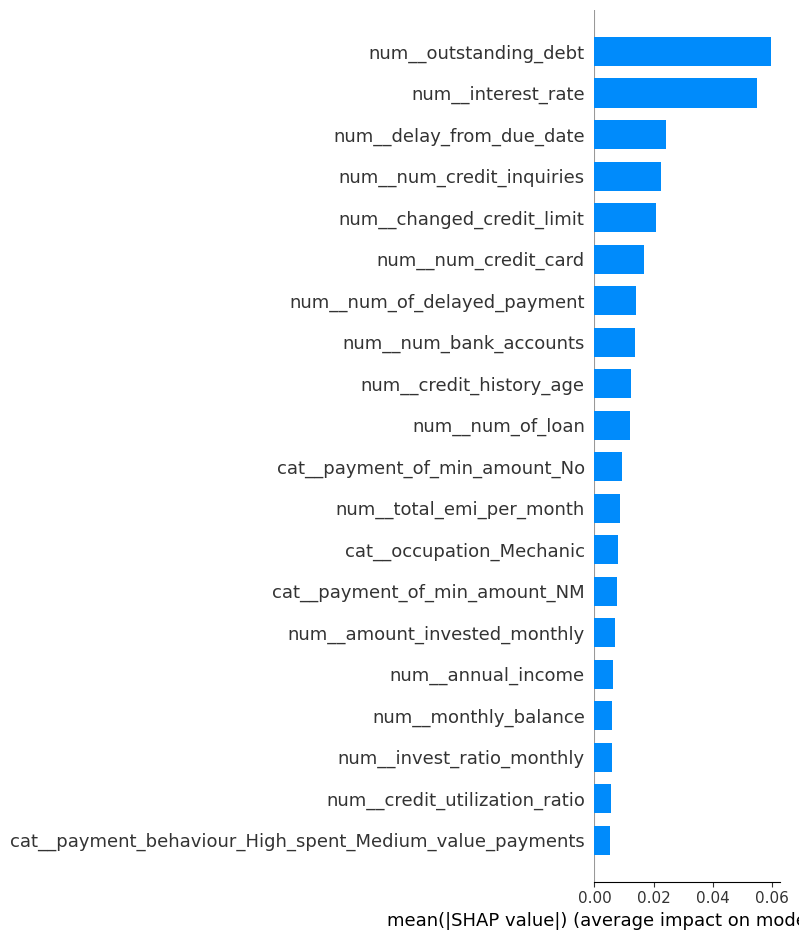

In [ ]:
# Aporte global
shap.summary_plot(shap_values[:,:,1], X_test_procesado, plot_type = "bar")

Del gráfico se comenta que las 2 variables más relevantes son `outstanding_debt` y `interest_rate`, lo cual tiene sentido ya que estas hablan de los hábitos financieros de los clientes.

Luego, se analizaron 10 observaciones aleatorias utilizando el método `waterfall` de Shap Values.

In [ ]:
# Generar una secuencia de números enteros desde 1 hasta 1502
secuencia = np.arange(1, shap_values.shape[0])

# Seleccionar 10 números al azar sin repetición
intancias_aleatorias = np.random.choice(secuencia, size=10, replace=False)

print(intancias_aleatorias)

[1459  498  966  658  463  528 1004  928  300 1370]


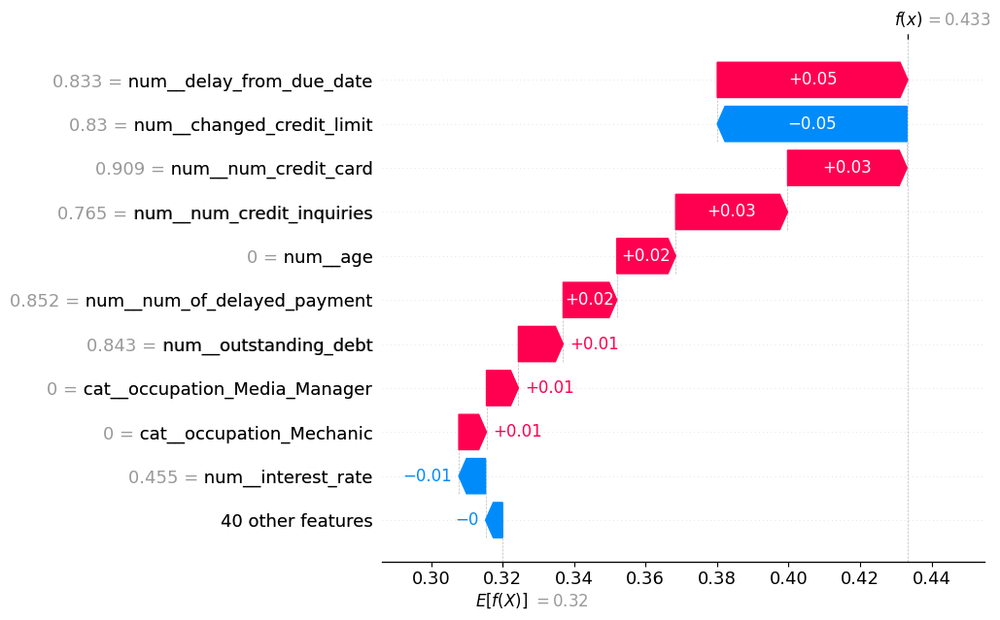

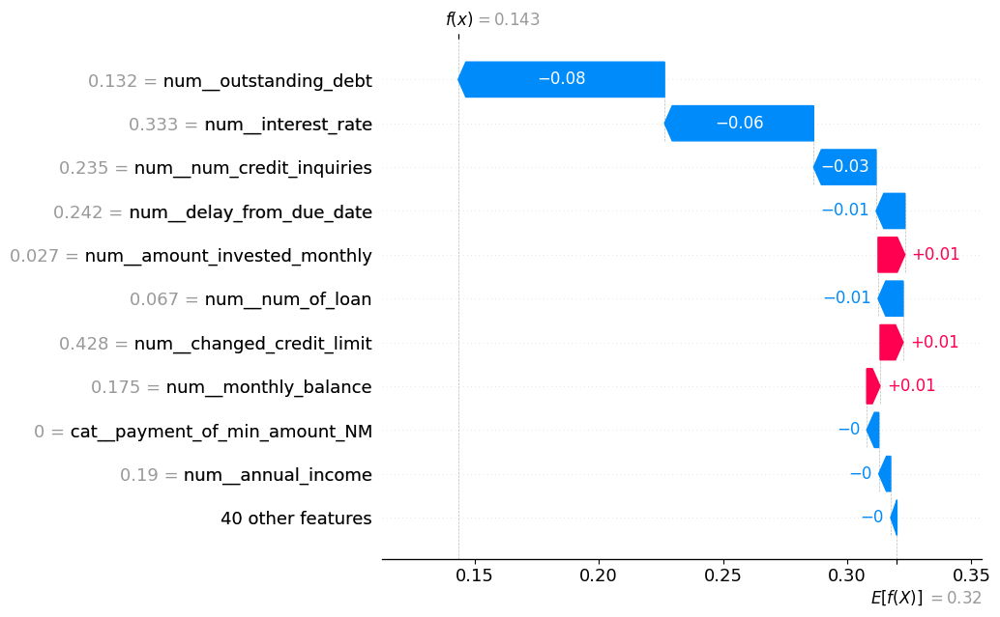

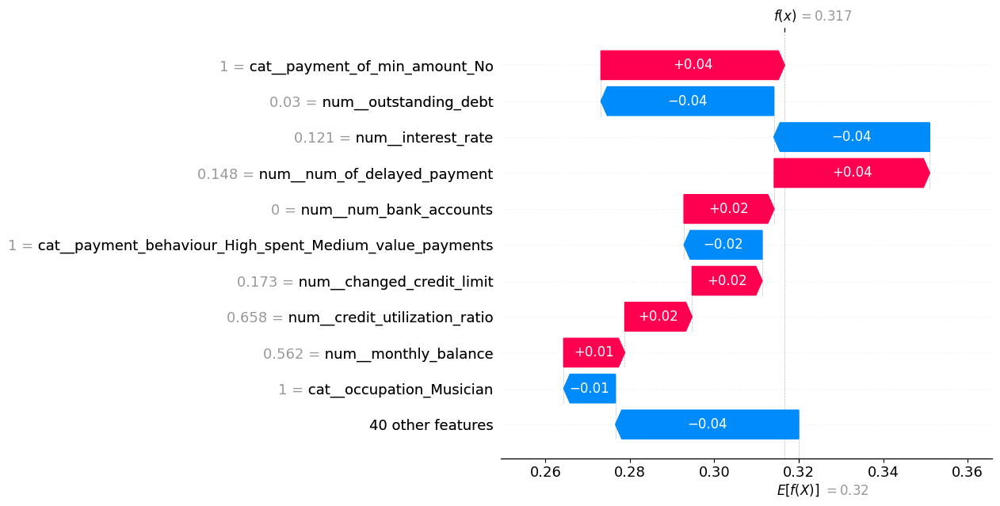

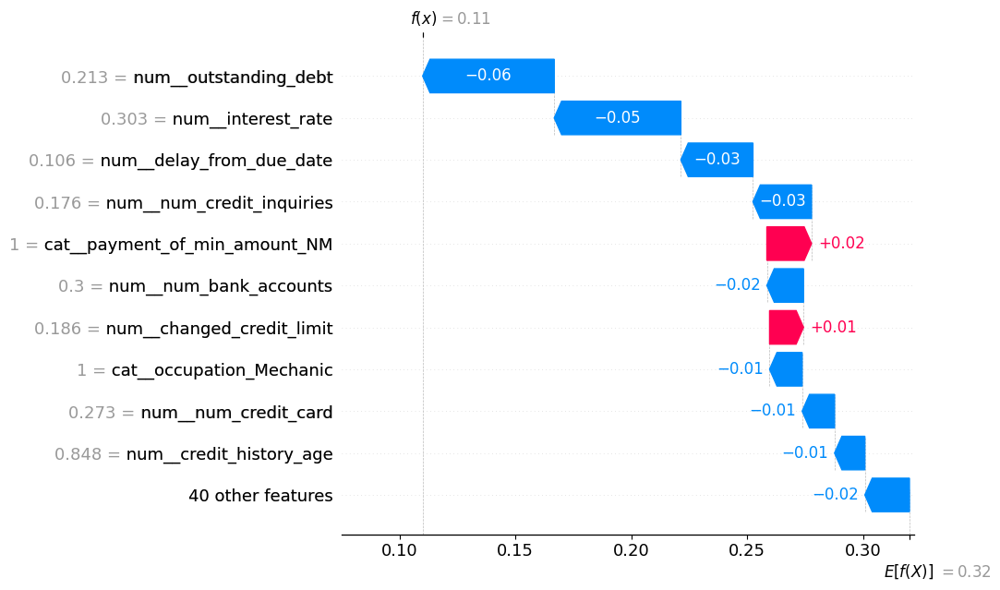

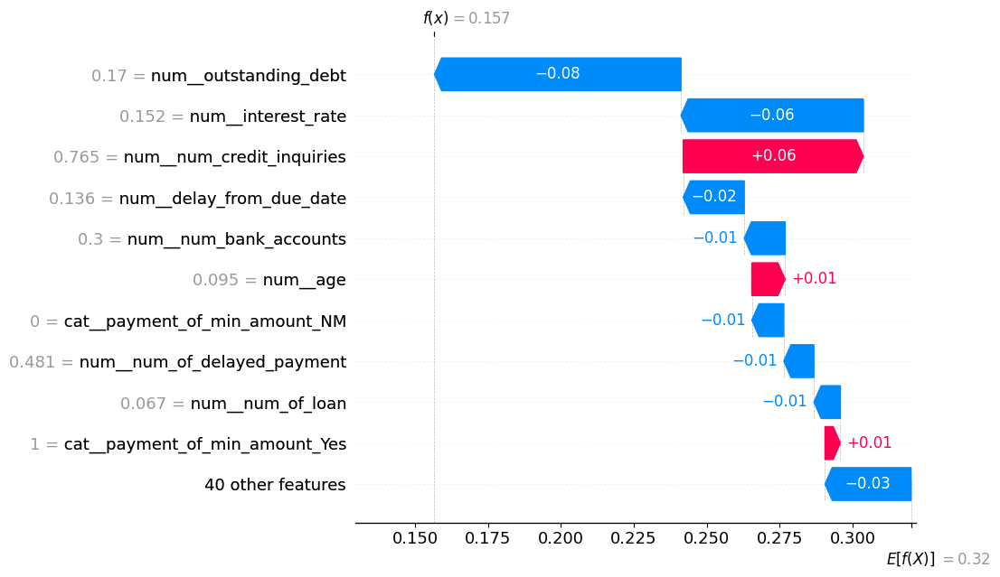

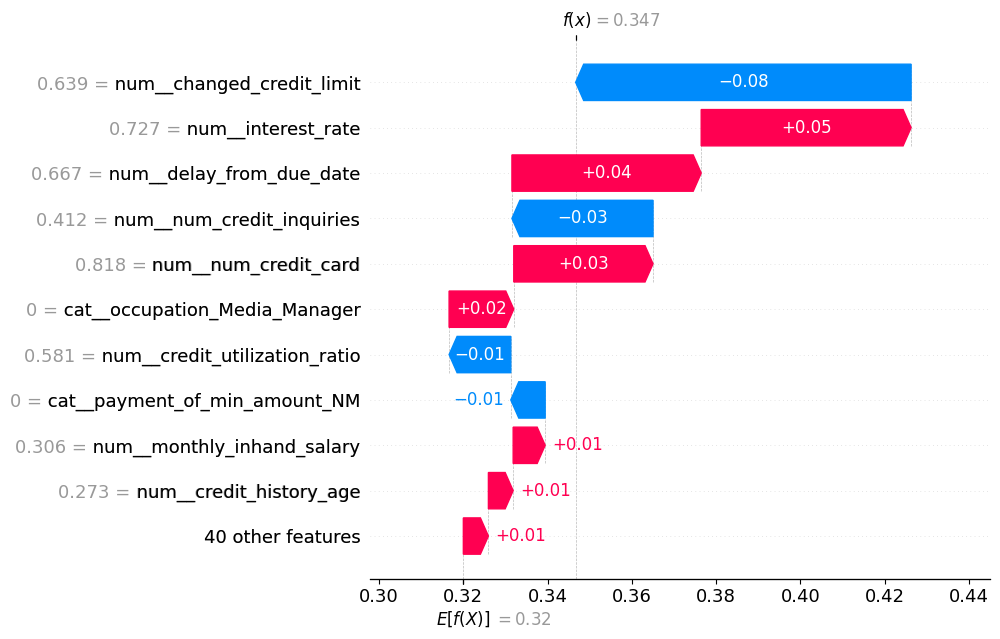

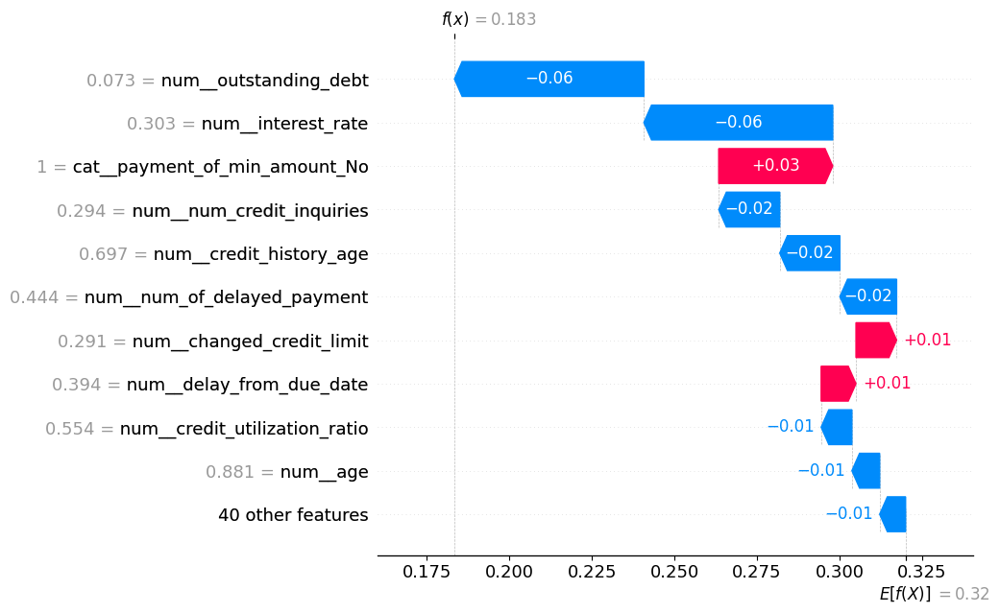

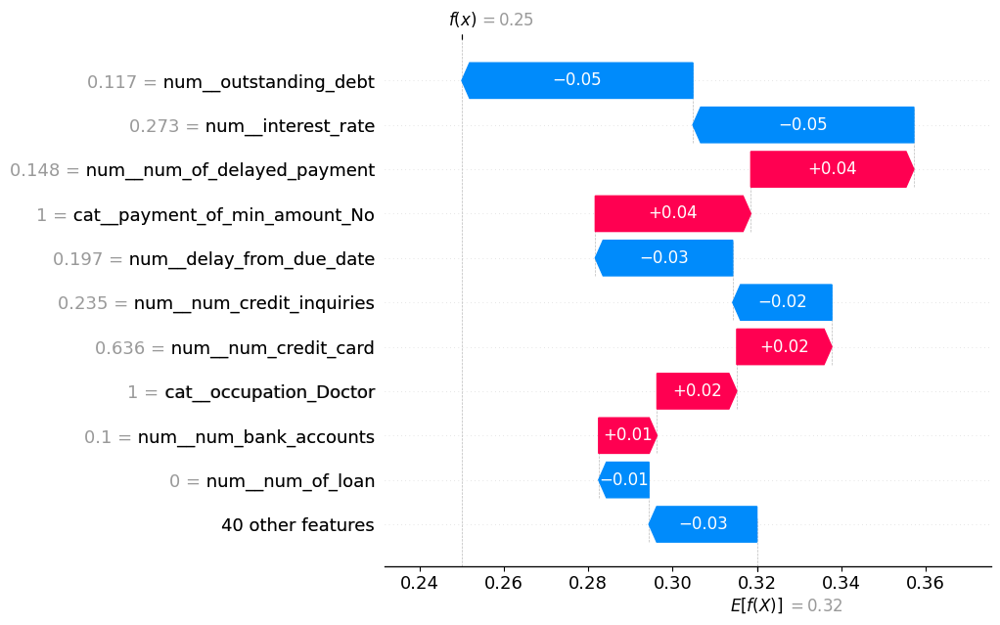

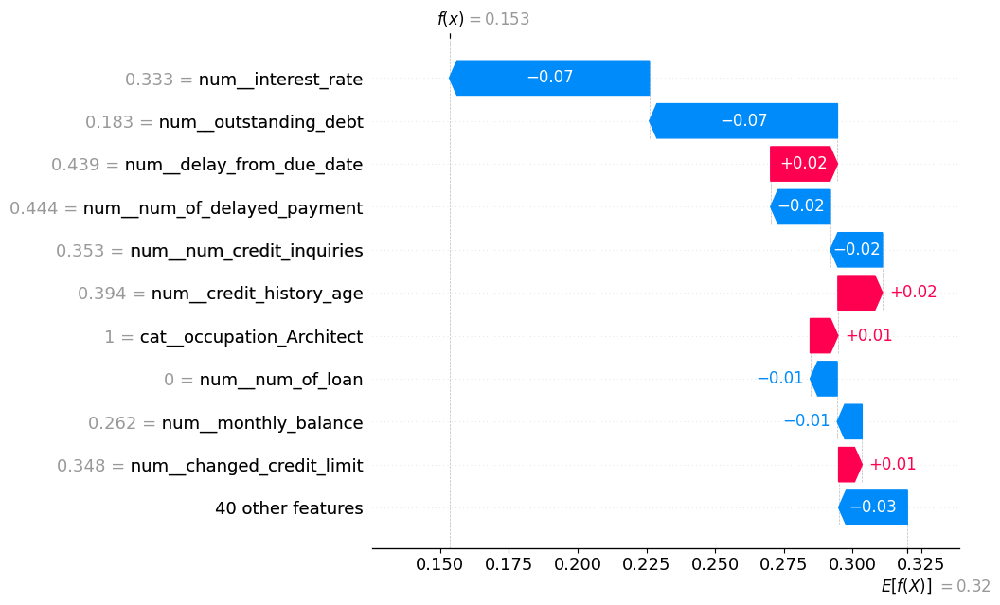

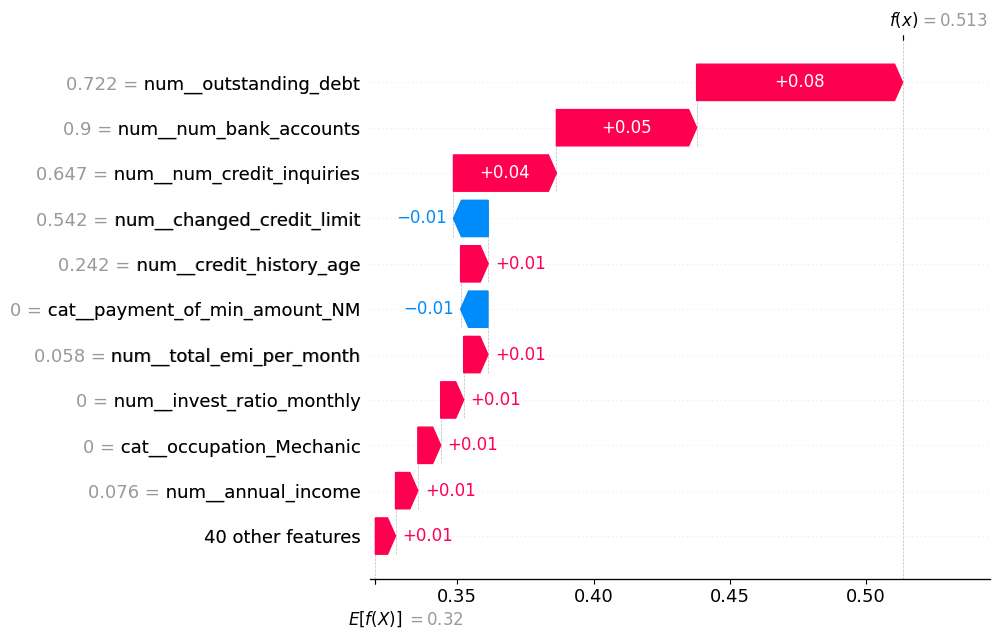

In [ ]:
# Instancias
for i in intancias_aleatorias:
  shap.plots.waterfall(shap_values[i,:,1], max_display=11)

En general, las características que más aportan estan relacionadas con el historial crediticio, inversión e ingresos de las personas, donde dependiendo sea el caso, valores altos o bajos afectan de distinta forma al `credit_score`, y donde, a priori, no se puede observar ninguna inconsistencia. Por ejemplo, de las instancias se observa que valores altos en días de retraso o cuentas impagas, afectan negativamente, hablando así de un cliente riesgoso; lo que hace sentido.

Por otra parte, si bien no es en todas las instancias estudiadas, hay algunos casos donde dentro de las 10 variables mostradas aparece la ocupación de la persona, lo que si bien puede proporcionar información sobre la estabilidad laboral y la capacidad de generar ingresos regulares, hay que tener cuidado en no mirar únicamente esta variable ya que su historial crediticio e ingresos pueden mostrar una historia completamente distinta.

Ahora, para explorar cómo se relacionan las variables se utilizó un scatterplot.

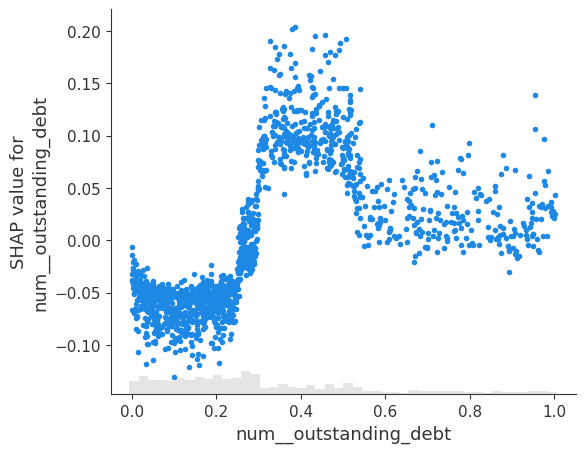

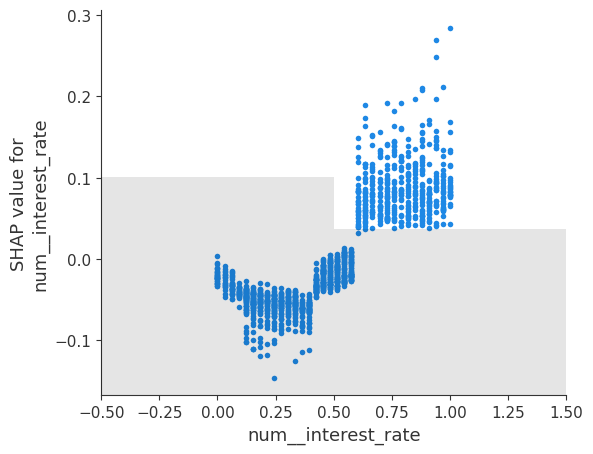

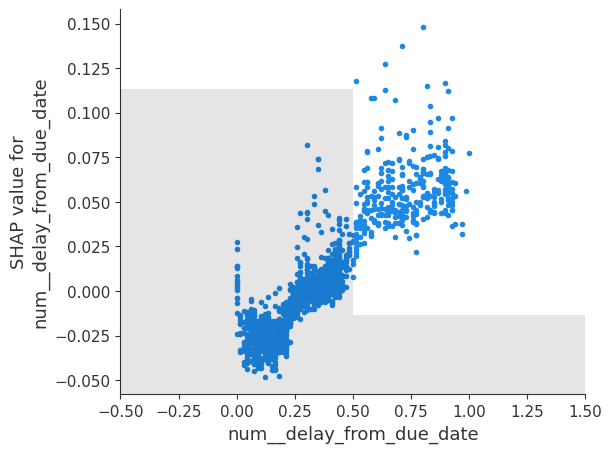

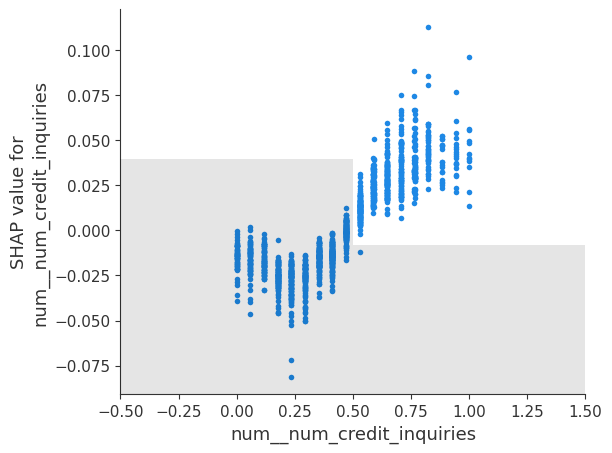

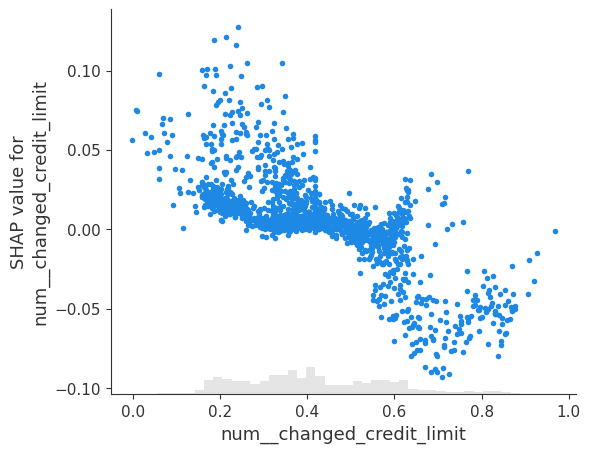

...

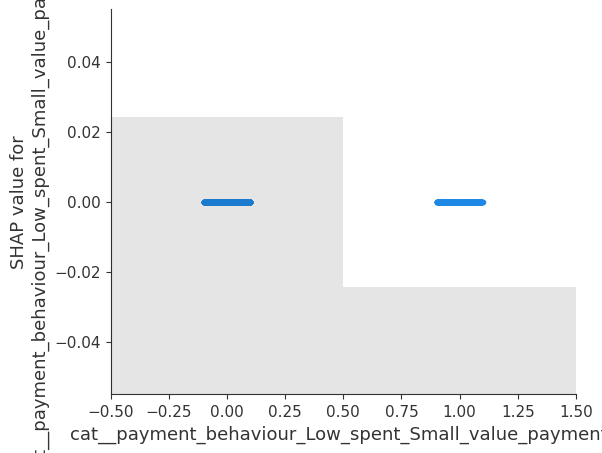

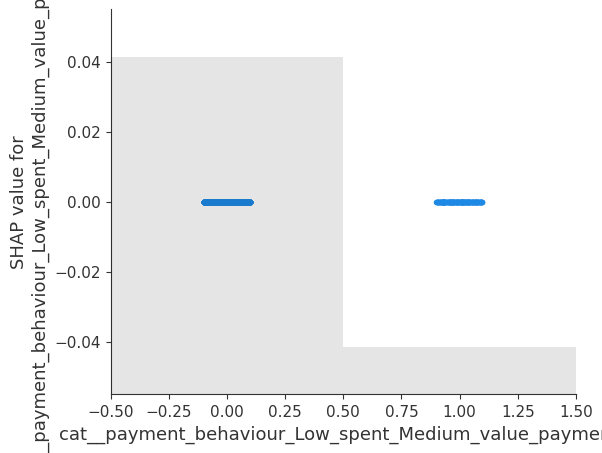

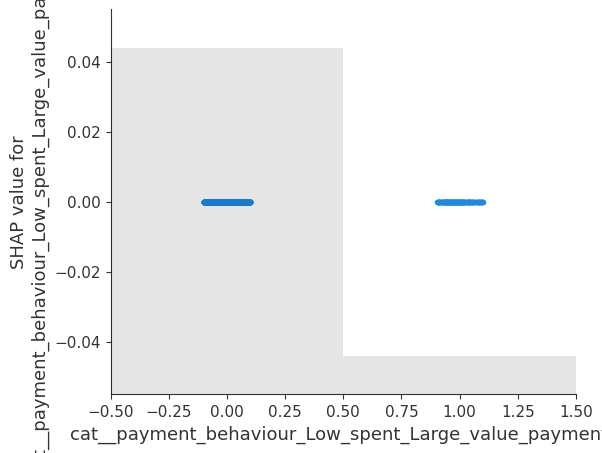

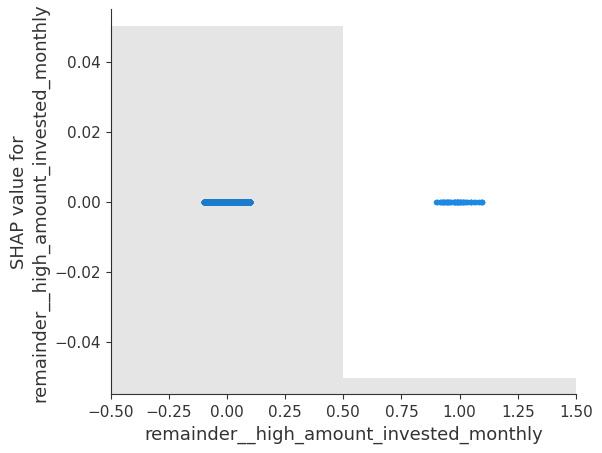

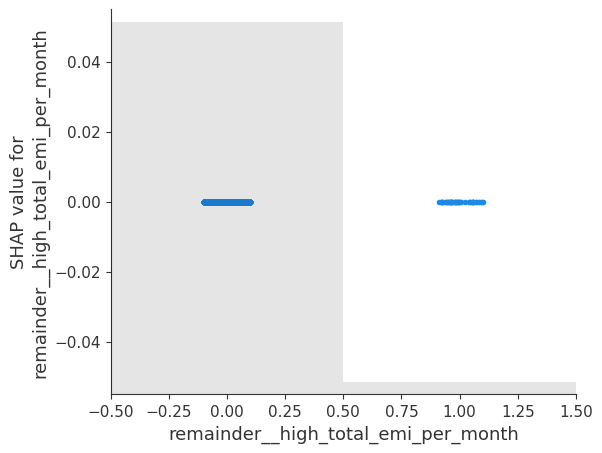

In [ ]:
#Explorar cómo se relacionan las variables utilizando algún descriptivo de interpretabilidad.

# Se obtienen los shap values
shap_values_abs = np.mean(np.abs(shap_values.values[:,:,1]), axis=0)

# Se obtienen los nombres ordenados de mayor a menor
feature_importance_names = X_test_procesado.columns[shap_values_abs.argsort()[::-1]]

# Scatter Plot
for name in feature_importance_names[:50]:
    shap.plots.scatter(shap_values[:, name, 1])
    print('')

De las interacciones entre las variables se obtiene que bajos valores de `outstanding_debt`, `interest_rate`,  se tienen para clientes menos riesgosos, con shap values negativos que aumentan drásticmente después de un umbral.

Por otra parte, aumentos en las variables `delay_from_due_date`, `num_credit_inquiries` y `monthly_balance` se relacionan con clientes más riesgosos.

Con respecto a `changed_credit_limit`, `num_credit_card` y `total_emi_per_month`, se tiene que cuando estas variables aumentan disminuyen los shap values, por lo que los clientes son menos riesgosos.

Para `num_of_delayed_payments`, `num_bank_accounts` y `annual_income`se observa que valores muy altos o muy bajos tienen shap values positivos, siendo estas las categorías más riesgosas.

Para la variable `credit_history_age` se tiene que para valores altos se relaciona con un bajo riesgo y para valores bajos no está muy clara la relación.

Para `num_of_loan` tiende a aumentar los shap values al aumentr la variable aunque no está tan claro para valores extremos.

Para la variable `payment_of_min_amount_no` se tiene las personas que no pagan la cuota mínima están asociadas a un mayor riesgo.

Con respecto a `occupation_mechanic` se tiene que los mecánicos están relacionados con menor riesgo al igual que `occupation_musician`.

Por otra parte, las ocupaciones riesgosas son: `occupation______` (sin información), `occupation_architech`

Por otro lado, entre las profesionesque no está claro el efecto tenemos: `occupation scientist`, `occupation_manager`, `occupation_accountant`, `occupation_teacher`, `ocuppation_teacher`, `occupation_doctor`, `occupation_lawyer`, `occupation_writter`, `occupation_developer`, `occupation_entrepreneur`, `occupation_engineer` y `occupation_media_manager`.

Para `credit_utilization_ratio` se tiene que valores muy altos de esta variable se asocian con un alto riesgo al igual que `age`.

Para `payment_behaviour_High_spent_Medium_value_payment` se observa que está relacionado con bajo riesgo cuando esta variable es igual a 1.

Para `amount_invested_monthly` no se tiene un claro patrón con el riesgo del cliente al igual que `invest_ratio_monthly`, `payment_of_min_ammount_yes`, `payment_behaviour_High_spent_Large_value_payment` y `monthly_high_salary`.


Por último, para identificar las variables irrelevantes se calculó la media del valor absoluto de los shap values de cada una, con lo cual valores iguales a cero indican que la variable es irrelevante.

In [ ]:
# Shap Absoluto
shap_abs_variables = np.mean(np.abs(shap_values.values[:,:,1]), axis=0)
shap_abs_variables

array([0.00407537, 0.00614135, 0.0039397 , 0.01376091, 0.01654935,
       0.05501354, 0.01213145, 0.02414734, 0.01401458, 0.02078675,
       0.02241883, 0.05964221, 0.0056835 , 0.01234106, 0.00852634,
       0.00698394, 0.00597477, 0.00595856, 0.00128   , 0.0013947 ,
       0.00062587, 0.00077294, 0.00047288, 0.00049099, 0.00118684,
       0.00076094, 0.00134376, 0.00806075, 0.004436  , 0.00251278,
       0.00149801, 0.00122067, 0.00073488, 0.0017753 , 0.00746656,
       0.0092223 , 0.00205542, 0.00154481, 0.00060925, 0.00507508,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ])

In [ ]:
# Variables irrelevantes
for i in range(len(X_test_procesado.columns[shap_abs_variables.argsort()[::-1]])):
  if shap_abs_variables[i] == 0:
    print(X_test_procesado.columns[shap_abs_variables.argsort()[::-1]][i])

remainder__monthly_inhand_salary_na
remainder__amount_invested_monthly_na
remainder__credit_history_age_na
remainder__changed_credit_limit_na
cat__payment_behaviour_High_spent_Small_value_payments
cat__payment_behaviour_Low_spent_Small_value_payments
cat__payment_behaviour_Low_spent_Medium_value_payments
cat__payment_behaviour_Low_spent_Large_value_payments
remainder__high_amount_invested_monthly
remainder__high_total_emi_per_month


Concluyéndose que las variables irrelevantes son:
* monthly_inhand_salary_na
* amount_invested_monthly_na
* credit_history_age_na
* changed_credit_limit_na
* payment_behaviour_High_spent_Small_value_payments
* payment_behaviour_Low_spent_Small_value_payments
* payment_behaviour_Low_spent_Medium_value_payments
* payment_behaviour_Low_spent_Large_value_payments
* high_amount_invested_monthly
* high_total_emi_per_month

## 8. Concluir [1.0 puntos]

Para concluir se comenta que se lograron identificar las variables más relevantes al momento de predecir el `credit_score` de un cliente, siendo estas `outstanding_debt` e `interest_rate` las más relevantes. Los resultados obtenidos permiten manejar de mejor manera el riesgo de los créditos que ofrece la empresa, por lo cual se concluye que los resultados son aceptables. Pese a ello, a lo largo del EDA se logró verificar que existen datos mal ingresados a la BBDD del banco los cuales tuvieron que ser eliminados para evitar sesgos en los modelos entrenados. Adicionalmente, se eliminaron outliers para que el modelo se ajustara mejor al grueso de los datos.


Con respecto a los resultados de los modelos de clasificación, se comenta que estos tuvieron buen desempeño comparando con el clasificador Dummy, el cual tuvo un desempeño de `0.35` para la métrica `F1 score` para la clase minoritaria. Pese a ello, se considera que hay espacio de mejora ya que no se logró superar el umbral de `0.63` alcanzado por Random Forest tras la selección de hiperparámetros con el método de búsqueda `Optuna Search`. Este modelo no tuvo una mejora significatiba con respecto a los modelos de baseline al considerar que `LGBMClassifier` alcanzó un `F1 score` para la clase minoritaria de `0.62` con sus hiperparámetros por defecto.

Para finalizar, se concluye que los resultados permitirían mejorar la situación actual de la empresa. Sin embargo, es posible que sea mejor modelar el cupo máximo del crédito asignado a un cliente en función de su riesgo y capacidad de pago, ya que las clasificaciones binarias en el problema de riesgo de crédito podrían ser una sobresimplificación del problema, especialmente considerando que no se alcanzó una métrica tan alta para el mejor modelo entrenado. Adicionalmente, calcular el monto máximo de crédito a asignar permite aumentar al máximo el monto que puede ganar el banco a través de intereses, ya que es posible que la solución óptima permita un grupo minoritario de clientes que no pagan consistentemente su crédito con tal de no dejar afuera a clientes que sí pagan consistentemente por errores de clasificación.

Los principales aprendizjes de proyecto se centran en aprender sobre el mundo de riesgo crediticio y los posibles proyectos que se pueden hacer con Machine Learning en esta área. Por otra parte, habría sido bueno haber aprendido más sobre el mundo de las finanzas previo a realizar el proyecto, para poder así ver si los resultados obtenidos tienen sentido con los esperado teóricamente ya que es posible que en los métodos de interpretabilidad hayan variables cuyo efecto sea contradictorio y sea mejor dejarlas de lado. Por último se desataca que se aprendió a usar una nueva técnicas de búsqueda de hiperparámetros con `Optuna Search` cuyo tiempo computacional es mucho menos a métodos tradicionales como `Halving Grid Search`.